In [1]:
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import glob
import time
import copy
import random
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table, join, MaskedColumn
from astropy.nddata import NDData
from astropy.visualization import simple_norm
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy import wcs
from astropy.coordinates import SkyCoord
from astropy.coordinates import match_coordinates_sky
from astropy.time import Time
from photutils import DAOStarFinder
from photutils import CircularAperture, CircularAnnulus
from photutils import aperture_photometry
from photutils.psf import IterativelySubtractedPSFPhotometry as ISPSF
from photutils.psf import extract_stars
from photutils.psf.groupstars import DAOGroup
from photutils import EPSFBuilder
from photutils.background import MMMBackground
from photutils.utils import make_random_cmap
import astroalign as aa
import pickle

import jakeGloess as jg
from test_import import help_me
from scipy.stats import iqr
import seaborn as sns
from scipy.signal import lombscargle
from scipy.optimize import curve_fit
from astropy.io.votable import parse, parse_single_table
import os.path
from astroquery.irsa_dust import IrsaDust

### Functions:

In [2]:
# could add a check to see if apertures need to be plotted (in case i want to plot just the fits)
def plotting(region, ap, an, cmap, choice, savename):
    plt.imshow(region, cmap=cmap, origin='lower', norm=LogNorm(), interpolation='nearest')
    
    if choice == 'ap_only':
        ap.plot(color='blue', lw=.5, alpha=1.)
    elif choice == 'both_aps':
        ap.plot(color='blue', lw=.5, alpha=.5)
        an.plot(color='red', lw=.5, alpha=.5)
        
    plt.colorbar(fraction = 0.05)
    #plt.grid(True)
    plt.minorticks_on()
    plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
    plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
    
    if savename != None:
        plt.savefig('images/PAL13/'+savename, dpi=500)
    
    plt.gcf().set_size_inches(10, 6)
    plt.show()
    #plt.close()
    
def print_table_nicely(table):   # note: 'table' must be an astropy Table type
    for col in table.colnames:
        table[col].info.format = '%.8g'
    print(table)
    
def star_find(data, sigma, fwhm, std, roundness, sharphi):
    daofind = DAOStarFinder(threshold=sigma*std, fwhm=fwhm, roundlo=-roundness, roundhi=roundness, sharphi=sharphi)
    sources = daofind(data)
    return sources
    
def ap_phot(data, ap, an, bkg_method):
    all_apers = [ap, an]
    table = aperture_photometry(data, all_apers)
    
    if bkg_method == 'mean':
        bkg_mean = table['aperture_sum_1'] / an.area
        table['bkg_sum_mean'] = bkg_mean * ap.area
        table['star_bkgsub'] = table['aperture_sum_0'] - table['bkg_sum_mean']
        
        an_err = bkg_mean * ap.area / np.sqrt(an.area)
        ap_err = bkg_mean * np.sqrt(ap.area)
        poisson_err = np.sqrt(table['star_bkgsub'])
        table['counts_err'] = np.sqrt(an_err**2 + ap_err**2 + poisson_err**2)
        #table['perc_err'] = table['counts_err'] / table['star_bkgsub']
    
    elif bkg_method == 'median':
        annulus_masks = an.to_mask(method='center')
        bkg_median = []
        for mask in annulus_masks:
            annulus_data = mask.multiply(data)
            annulus_data_1d = annulus_data[mask.data > 0]
            _, median_mask, _ = sigma_clipped_stats(annulus_data_1d)
            bkg_median.append(median_mask)
            
        bkg_median = np.array(bkg_median)
        table['bkg_sum_median'] = bkg_median * ap.area
        table['star_bkgsub'] = table['aperture_sum_0'] - table['bkg_sum_median']
        
        an_err = bkg_median * ap.area / np.sqrt(an.area)
        ap_err = bkg_median * np.sqrt(ap.area)
        poisson_err = np.sqrt(table['star_bkgsub'])
        table['counts_err'] = np.sqrt(an_err**2 + ap_err**2 + poisson_err**2)
        #table['perc_err'] = table['counts_err'] / table['star_bkgsub']
        
    else:
        print('\n\nPlease give a valid bkg_method kthx\n\n')
            
    return table

def apparent_magnitude_err(counts, apcorr, zmag_err, counts_err, apcorr_err):
    mag_err = np.sqrt(zmag_err**2 + (2.5 * np.sqrt((counts_err/counts)**2 + (apcorr_err/apcorr)**2) / np.log(10))**2)
    return mag_err

def make_catalog(x, y, header):
    crd = np.transpose((x, y))
    w = wcs.WCS(header)
    world = w.wcs_pix2world(crd, 0)
    ra = world[:,0]
    dec = world[:,1]
    cat = SkyCoord(ra, dec, frame='icrs', unit='deg')
    
    return cat, ra, dec

### Initial conditions:

In [3]:
run_all = True  # set to False to run only the first epoch
base_dir = 'data/PAL13/'
channel = '3p6um'
#channel = '4p5um'
#method = 'aperture'
method = 'PSF'
model_epoch = 'master'  # ePSF model epoch to use (loads from file now for ease)

sigma_level = 6.
if channel == '3p6um':
    sigma_level_PSF = 50.
elif channel == '4p5um':
    sigma_level_PSF = 20.
FWHM = 5.
r_ap = 6.
r_in = 6.
r_out = 14.
roundness = 0.5
#sharphi = 0.9
sharphi = 1.
sharphi_model = 0.7
#sharplo = 0.65

if channel == '3p6um':
    zmag       = 18.80    # given in/calculated using IRAC handbook, section 4.8
    zmag_err   =  0.02    # calculated from zmag = 2.5log10(F0/C), F0 = 280.9 +/- 4.1 (from IRAC, table 4.1)
    apcorr     =  1.1233  # aperture correction for 6, 6-14 pix apertures in channel 1; given on IRAC website
    apcorr_err =  0.0225  # taking accuracy to be ~2%, as mentioned in IRAC, section 4.10
elif channel == '4p5um':
    zmag       = 18.32
    zmag_err   =  0.02
    apcorr     =  1.1336
    apcorr_err =  0.0227
else:
    print('Please select a valid channel')

### Building an ePSF from one image:

File to build ePSF model from: data/PAL13/PAL13__e1/PAL13__e1_4p5um.fits


<ipython-input-4-7e1829f43264>:64: RuntimeWarning: invalid value encountered in sqrt
  poisson_err = np.sqrt(table['star_bkgsub'])


    x         y      id
--------- --------- ---
776.23929 101.06141   0
845.86273 178.04758   1
1238.0455 181.88059   2
459.93375 199.64272   3
 1108.391  227.5802   4
495.88063 240.16068   5
976.75502 249.02389   6
1327.8821 261.00714   7
552.41924  289.4809   8
305.61985 290.99502   9
      ...       ... ...
973.88258 485.86103  31
954.45272 502.46563  32
230.62556 502.81522  33
751.01957  503.9549  34
1154.2186 562.85613  35
 988.8259 567.40994  36
1011.1138 590.40696  37
367.50038 607.03232  38
263.18077 612.58125  39
1034.2544 615.46481  40
506.02901 616.61334  41
Length = 42 rows
Number of model stars: 42


C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


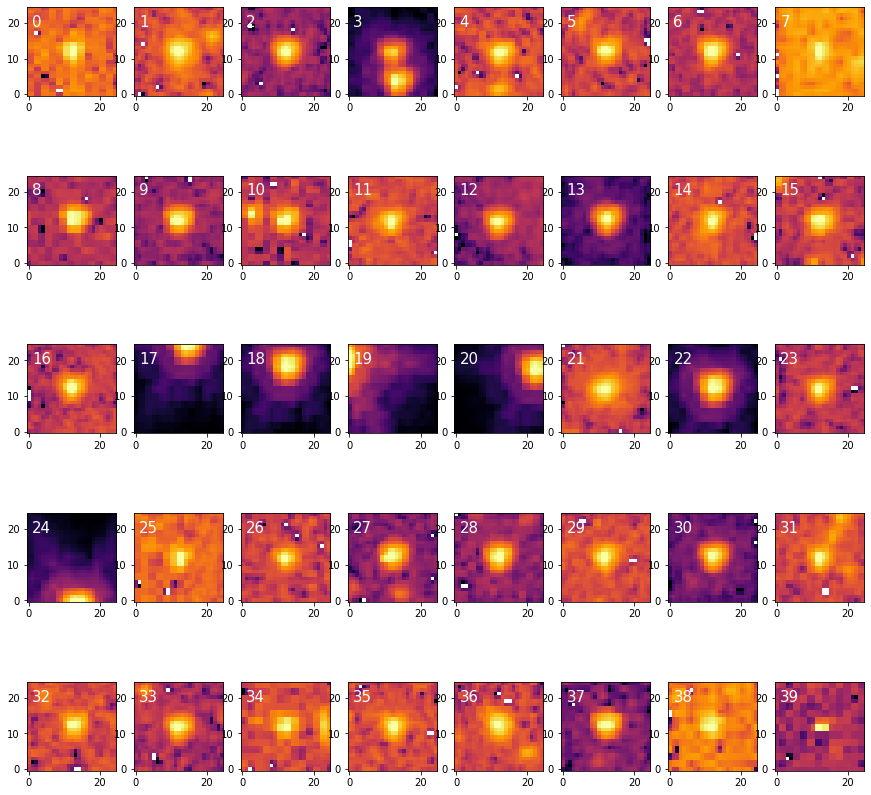

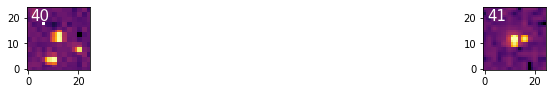

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


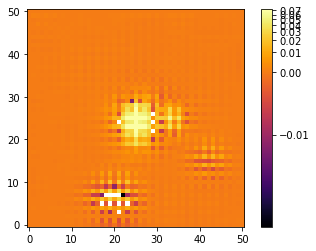

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
0 3 7 10 17 18 19 20 21 25 31 24 36 38 39 40 41
[0, 3, 7, 10, 17, 18, 19, 20, 21, 25, 31, 24, 36, 38, 39, 40, 41]
    x         y      id
--------- --------- ---
845.86273 178.04758   1
1238.0455 181.88059   2
 1108.391  227.5802   4
495.88063 240.16068   5
976.75502 249.02389   6
552.41924  289.4809   8
305.61985 290.99502   9
434.53021 315.57557  11
1239.6484 318.53263  12
1048.3015 340.46894  13
      ...       ... ...
 844.6686  387.7772  23
947.70148 409.69738  26
 945.6244 444.26626  27
270.05994 457.11197  28
1117.5563 462.00328  29
473.94687  464.4112  30
954.45272 502.46563  32
230.62556 502.81522  33
751.01957  503.9549  34
1154.2186 562.85613  35
1011.1138 590.40696  37
Length = 25 rows
Number of model stars: 25


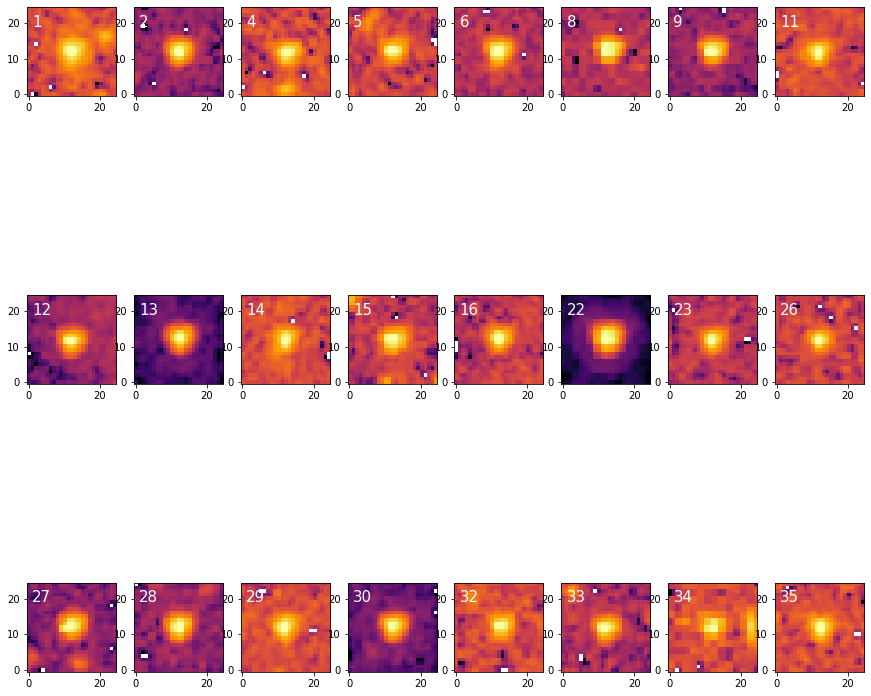

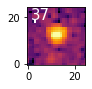

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


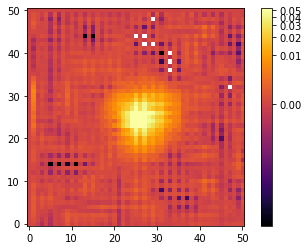

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
34 8
[34, 8]
    x         y      id
--------- --------- ---
845.86273 178.04758   1
1238.0455 181.88059   2
 1108.391  227.5802   4
495.88063 240.16068   5
976.75502 249.02389   6
305.61985 290.99502   9
434.53021 315.57557  11
1239.6484 318.53263  12
1048.3015 340.46894  13
462.86988 345.72765  14
289.95735 360.95049  15
1155.9945 366.18998  16
1310.3243 384.32116  22
 844.6686  387.7772  23
947.70148 409.69738  26
 945.6244 444.26626  27
270.05994 457.11197  28
1117.5563 462.00328  29
473.94687  464.4112  30
954.45272 502.46563  32
230.62556 502.81522  33
1154.2186 562.85613  35
1011.1138 590.40696  37
Number of model stars: 23


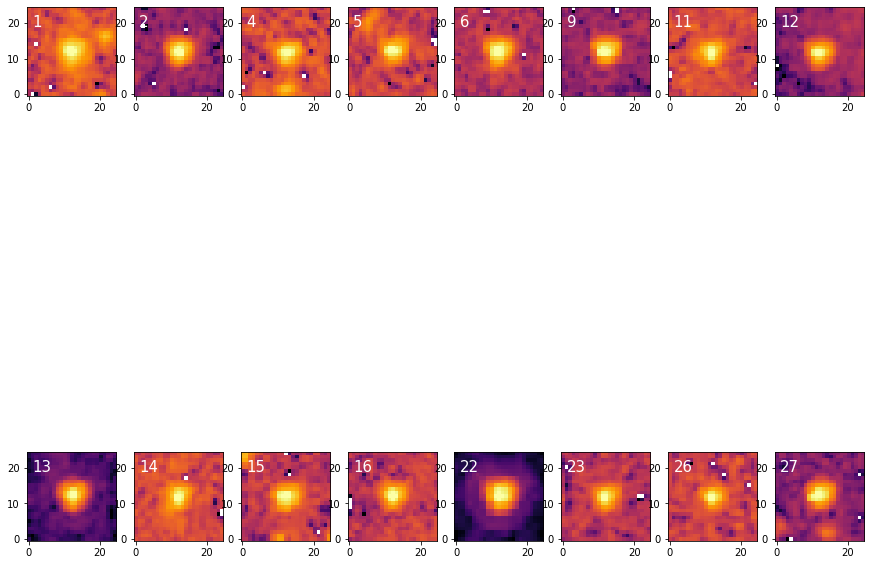

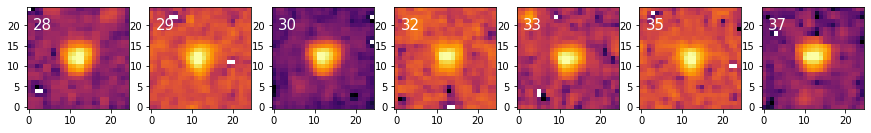

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


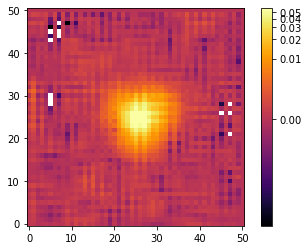

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
-1
[-1]
Congrats Phil Collins, you escaped


In [9]:
###   BUILDING AN EPSF MODEL FROM ONE IMAGE   ###    

which_epoch = 'master'   # set to 'master' to build model from medianed image

if which_epoch == 'master':
    file_model = base_dir+'PAL13/'+'PAL13_'+channel+'.fits'
else:
    file_model = base_dir+'PAL13__e'+str(which_epoch)+'/PAL13__e'+str(which_epoch)+'_'+channel+'.fits'

print('File to build ePSF model from: {}'.format(file_model))
with fits.open(file_model) as hdu_list:
    data_model = hdu_list[0].data
    hdr_model = hdu_list[0].header
    if channel == '4p5um':
        fluxconv_model = 0.1469  # taken from epoch (all the same), missing in master header for some reason
    else:
        fluxconv_model = hdr_model['FLUXCONV']
    data_model *= hdr_model['EXPTIME'] / fluxconv_model

###   LOCATING STARS FOR PSF MODEL AND PLOTTING THEM   ###

mean, median, std = sigma_clipped_stats(data_model, sigma=sigma_level)

sources_model = star_find(data_model, sigma_level_PSF, FWHM, std, roundness, sharphi_model)
pos_model = np.transpose((sources_model['xcentroid'], sources_model['ycentroid']))
ap_model = CircularAperture(pos_model, r_ap)
an_model = CircularAnnulus(pos_model, r_in, r_out)
#print('No. of stars detected to build model from: {0}'.format(len(sources_model)))
#plotting(data_model, ap_model, an_model, 'Greys', choice='both_aps', savename=None)

###   DOING APERTURE PHOTOMETRY ON MODEL STARS   ###

phot_table = ap_phot(data_model, ap_model, an_model, 'median')
#print_table_nicely(phot_table)

cutout_size = 150
hsize = (cutout_size - 1) / 2
x_model = phot_table['xcenter'].value
y_model = phot_table['ycenter'].value
mask = ((x_model > hsize) & (x_model < (data_model.shape[1] - 1 - hsize)) &
        (y_model > hsize) & (y_model < (data_model.shape[0] - 1 - hsize)))
model_table = Table()
model_table['x'] = x_model[mask]
model_table['y'] = y_model[mask]

# Just numberin' the stars, don't mind me
model_table['id'] = np.array(range(len(model_table)))
print_table_nicely(model_table)

pos_model = np.transpose((model_table['x'], model_table['y']))
ap_model = CircularAperture(pos_model, r_ap)
#plotting(data_model, ap_model, an=None, cmap='Greys', choice='ap_only', savename=None)

while True:
    
    ###   BUILDING AN EPSF   ###

    nddata = NDData(data = data_model - median)
    model_stars = extract_stars(nddata, model_table, size=25)
    print('Number of model stars: {}'.format(len(model_stars)))
    figsize = 15
    ncols = 8
    nrows = int(np.floor(len(model_stars) / ncols))
    nremainder = len(model_stars) - (nrows*ncols)
    
    # Show images of most of the stars in a nice grid:
    fig, ax = plt.subplots(nrows, ncols, figsize=(figsize,figsize), squeeze=True)
    ax = ax.ravel()        
    for i in range(nrows*ncols):
        norm = simple_norm(model_stars[i], 'log', percent=99.)
        ax[i].imshow(model_stars[i], norm=norm, origin='lower', cmap='inferno', interpolation='nearest')
        #ax[i].set_title(model_table['id'][i])
        ax[i].text(1, 19, model_table['id'][i], color='w', size=15)
    plt.show()
    
    # Show images of the remaining stars that don't fit in the grid:
    fig, ax = plt.subplots(nrows=1, ncols=nremainder, figsize=(figsize,figsize/(figsize-nremainder)), squeeze=False)
    ax = ax.ravel()
    for i in range(nrows*ncols, len(model_stars)):
        norm = simple_norm(model_stars[i], 'log', percent=99.)
        ax[i-nrows*ncols].imshow(model_stars[i], norm=norm, origin='lower', cmap='inferno', interpolation='nearest')
        #ax[i-nrows*ncols].set_title(model_table['id'][i])
        ax[i-nrows*ncols].text(1, 19, model_table['id'][i], color='w', size=15)
    plt.show()

    epsf_builder = EPSFBuilder(oversampling=2, maxiters=10, progress_bar=True)
    epsf, fitted_stars = epsf_builder(model_stars)
    norm = simple_norm(epsf.data, 'log', percent=99.)
    plt.imshow(epsf.data, norm=norm, origin='lower', cmap='inferno')
    plt.colorbar()
    plt.show()

    print('Input bad stars to remove them from the model (type -1 to exit simulation and save model):')
    adios = [int(x) for x in input().split()]
    print(adios)

    if adios == [-1]:
        print('Congrats Phil Collins, you escaped')
        
        save_name = 'epsf_models/PAL13/epsf_'+channel+'_'+str(which_epoch)+'.pickle'
        pickle_out = open(save_name, 'wb')
        pickle.dump(epsf, pickle_out)
        pickle_out.close()
        
        break

    #model_table.remove_rows(adios)
    
    # Remove bad stars from the table:
    model_table.add_index('id')
    byebye = model_table.loc_indices[adios]
    model_table.remove_rows(byebye)

    print_table_nicely(model_table)

### Generating master source list:

data/PAL13/PAL13/PAL13_3p6um.fits


No. of stars detected: 999


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


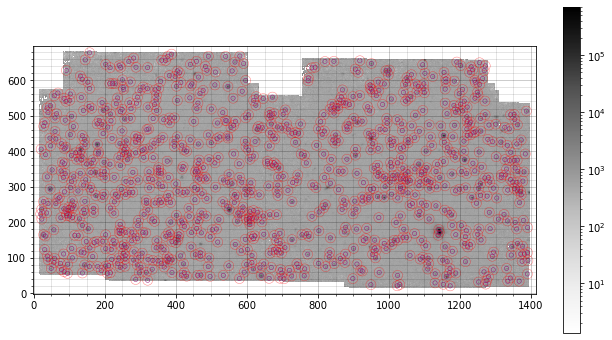

 id    x_0       y_0    sharpness  ...    peak      flux       mag     group_id
--- --------- --------- ---------- ... --------- --------- ----------- --------
  1 1023.3861 21.336295 0.54847606 ...  1359.229 1.6006271 -0.51072543        1
  4 1030.6396 24.900292 0.58596559 ... 6371.2075 12.909618  -2.7772835        1
  2  1172.343 21.167364 0.49837368 ... 1052.0157 1.2178232  -0.2139606        2
  3 949.26181 24.567034 0.51010887 ... 1440.5463 2.0867559  -0.7986791        3
  5 1153.1168  25.51441 0.54536116 ... 1157.2856 1.3934209 -0.36020581        4
  6 1272.4713 26.122891 0.63285543 ... 1818.3502 2.5342301  -1.0096151        5
 11 1275.3878 36.124401   0.723346 ... 3439.1565 5.5963774  -1.8697675        5
 20 1280.4128 47.399125 0.46752961 ...  1635.316 2.5675486  -1.0237967        5
  7 1129.8404 29.485108 0.77541642 ...  1271.384 1.5116848 -0.44865315        6
  8 1252.3323 32.110566 0.58587514 ... 1502.3944 2.1750193 -0.84365781        7
...       ...       ...        ... ...  

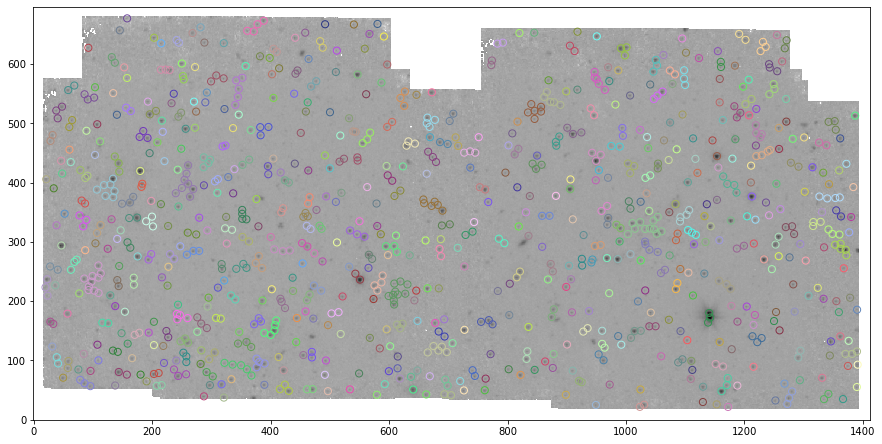

Time taken to fit PSF model: 20.222228299999998s
   x_0       y_0      flux_0    id ... id_master     RA       dec   
--------- --------- ---------- --- ... --------- --------- ---------
1023.3861 21.336295  11422.717   1 ...         0 346.72948 12.794099
1030.6396 24.900292  94929.749   4 ...         1 346.72939 12.792755
 1172.343 21.167364  -8868.863   2 ...         2 346.73926  12.77118
949.26181 24.567034  9375.8503   3 ...         3 346.72411 12.805304
1153.1168  25.51441  419.28172   5 ...         4 346.73732 12.773862
1272.4713 26.122891  18315.032   6 ...         5 346.74504 12.755449
1275.3878 36.124401  36937.604  11 ...         6 346.74365 12.754361
1280.4128 47.399125  16079.439  20 ...         7  346.7422 12.752868
1129.8404 29.485108 -3967.2453   7 ...         8 346.73517 12.777191
1252.3323 32.110566  3289.6183   8 ...         9 346.74278 12.758167
      ...       ...        ... ... ...       ...       ...       ...
1100.0416  658.3994  181281.45 111 ...      1109 346.6

In [4]:
epsf_file = 'epsf_models/PAL13/epsf_'+channel+'_'+str(model_epoch)+'.pickle'
pickle_in = open(epsf_file, 'rb')
epsf = pickle.load(pickle_in)

file_m = base_dir+'PAL13/PAL13_'+channel+'.fits'
with fits.open(file_m) as hdu_list:        
    print(file_m)
    image_m = hdu_list[0].data
    hdr_m = hdu_list[0].header
    exptime = hdr_m['EXPTIME']
    if channel == '4p5um':
        fluxconv = 0.1469  # taken from epoch (all the same), missing in master header for some reason
    else:
        fluxconv = hdr_m['FLUXCONV']
    conv = exptime / fluxconv
    data_m = image_m * conv

mean_m, median_m, std_m = sigma_clipped_stats(data_m, sigma=sigma_level)

sources_m = star_find(data_m, sigma_level, FWHM, std_m, roundness, sharphi)
pos_m = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
apertures_m = CircularAperture(pos_m, r_ap)
annuli_m = CircularAnnulus(pos_m, r_in, r_out)
print('No. of stars detected: {}'.format(len(sources_m)))
plotting(data_m, apertures_m, annuli_m, 'Greys', choice='both_aps', savename=None)

###   MASKING CHANNEL 2 TO IGNORE BRIGHT SPLODGE   ###

if channel == '4p5um':
    x_mask = sources_m['xcentroid']
    y_mask = sources_m['ycentroid']
    del sources_m
    xlim = 1150
    mask_m = (x_mask < xlim)
    sources_m = Table()
    sources_m['xcentroid'] = x_mask[mask_m]
    sources_m['ycentroid'] = y_mask[mask_m]

    pos_mask = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
    ap_mask = CircularAperture(pos_mask, r_ap)
    plotting(data_m, ap_mask, an=None, cmap='Greys', choice='ap_only', savename=None)

###   ###

sources_m['xcentroid'].name = 'x_0'
sources_m['ycentroid'].name = 'y_0'
#daogroup = DAOGroup(crit_separation=2.5*FWHM)
daogroup = DAOGroup(crit_separation=3.*FWHM)
star_groups = daogroup(sources_m)
star_groups = star_groups.group_by('group_id')
print_table_nicely(star_groups)

ncolors = max(star_groups['group_id'])
cmap = make_random_cmap(ncolors=ncolors, seed=1612)
plt.imshow(data_m, origin='lower', norm=LogNorm(), interpolation='nearest', cmap='Greys')
for i, group in enumerate(star_groups.groups):
    pos_group = np.transpose([group['x_0'], group['y_0']])
    ap_group = CircularAperture(pos_group, r_ap)
    ap_group.plot(color=cmap.colors[i], lw=1.)
plt.gcf().set_size_inches(15, 9)
plt.show()

data_m_nonans = np.nan_to_num(data_m, nan=0.00001, copy=True) # changing NaN values to a float so PSF fit doesn't crash

#bkg_estimation = MMMBackground()
#fitter = LevMarLSQFitter()
daofind_PSF = DAOStarFinder(threshold=sigma_level*std_m, fwhm=FWHM, roundlo=-roundness, roundhi=roundness, sharphi=0.85)
fit_rad = 5

epsf.x_0.fixed = True
epsf.y_0.fixed = True
init_pos_m = Table(names=['x_0', 'y_0'], data=[sources_m['x_0'], sources_m['y_0']])
#init_pos_m = Table(names=['x_0', 'y_0'], data=transf_list)

start = time.perf_counter()
PSF_photometry = ISPSF(finder = daofind_PSF,
                      group_maker = daogroup,
                      bkg_estimator = MMMBackground(),
                      psf_model = epsf,
                      fitter = LevMarLSQFitter(),
                      fitshape = 2*fit_rad+1,
                      niters = 2,
                      aperture_radius = 6.)
master_stars = PSF_photometry(image=data_m_nonans, init_guesses=init_pos_m)
residual_image_m = PSF_photometry.get_residual_image()
print('Time taken to fit PSF model: {}s'.format(time.perf_counter() - start))

master_stars['id_master'] = np.arange(len(master_stars))

cat_m, ra_m, dec_m = make_catalog(master_stars['x_0'], master_stars['y_0'], hdr_m)
master_stars['RA'] = ra_m
master_stars['dec'] = dec_m

print_table_nicely(master_stars)
master_stars.write('outputs/PAL13/table_'+channel+'_master''.txt', format='csv', overwrite=True)

#### Old version of master list (source detection only, no PSF):

In [ ]:
file_m = base_dir+'PAL13/PAL13_'+channel+'.fits'
with fits.open(file_m) as hdu_list:        
    print(file_m)
    image_m = hdu_list[0].data
    hdr_m = hdu_list[0].header
    exptime = hdr_m['EXPTIME']
    fluxconv = hdr_m['FLUXCONV']
    conv = exptime / fluxconv
    data_m = image_m * conv

mean_m, median_m, std_m = sigma_clipped_stats(data_m, sigma=sigma_level)

sources_m = star_find(data_m, sigma_level, FWHM, std_m, roundness, sharphi)
pos_m = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
apertures_m = CircularAperture(pos_m, r_ap)
annuli_m = CircularAnnulus(pos_m, r_in, r_out)
print('No. of stars detected: {}'.format(len(sources_m)))
plotting(data_m, apertures_m, annuli_m, 'Greys', choice='both_aps', savename=None)

sources_m['id'] -= 1
sources_m['id'].name = 'id_master'

cat_m, ra_m, dec_m = make_catalog(sources_m['xcentroid'], sources_m['ycentroid'], hdr_m)
sources_m['RA'] = ra_m
sources_m['dec'] = dec_m

print(sources_m)
#sources_m.write('outputs/PAL13/table_'+channel+'_master''.txt', format='csv', overwrite=True)
sources_m['xcentroid', 'ycentroid', 'RA', 'dec'].write('outputs/PAL13/master_list_test.txt', format='csv', overwrite=True)

### Main photometry code:

Photometry method selected: PSF


C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


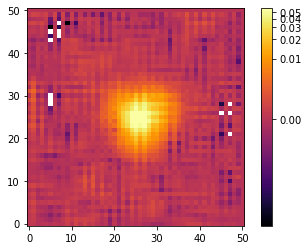

data/PAL13\PAL13__e1\PAL13__e1_4p5um.fits
EXPTIME: 81.4382324219
FLUXCONV: 0.1469


Mean: 167.05128479003906
Median: 166.14183044433594
Std dev: 14.59872055053711
Number of PSF stars: 472


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


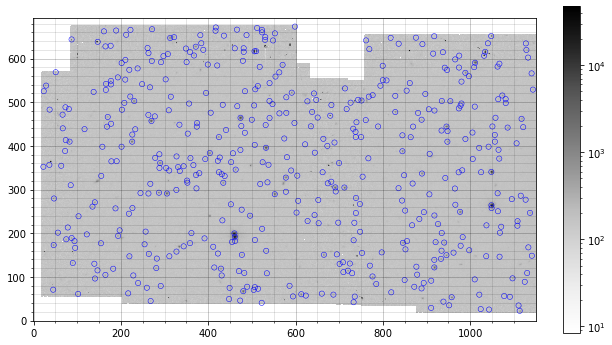

   x_0       y_0     id group_id
--------- --------- --- --------
1113.2673 22.366774   1        1
1043.0766 25.273232   2        2
1024.0461 26.351823   3        3
910.34866 29.041588   4        4
1110.6247 34.620407   5        5
951.67974  35.01905   6        6
522.44462  40.67337   7        7
732.91216 42.114825   8        8
938.66314 43.373516   9        9
268.15427 44.809232  10       10
      ...       ... ...      ...
523.26499 660.05688 462      402
523.04423 665.69061 467      402
511.86854 669.97932 470      402
161.20267 662.34907 463      403
189.11688 664.22141 464      404
416.70796 663.66497 465      405
417.36348 671.25072 471      405
221.95516 665.77015 466      406
271.34958 667.27527 468      407
465.87384 666.19777 469      408
 598.4786 673.19403 472      409
Length = 472 rows


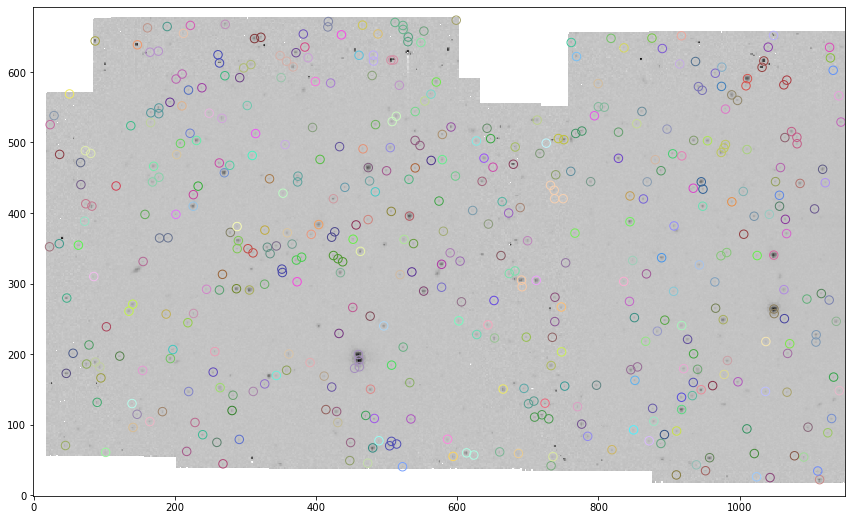

Time taken to fit PSF model: 14.13362699999999s


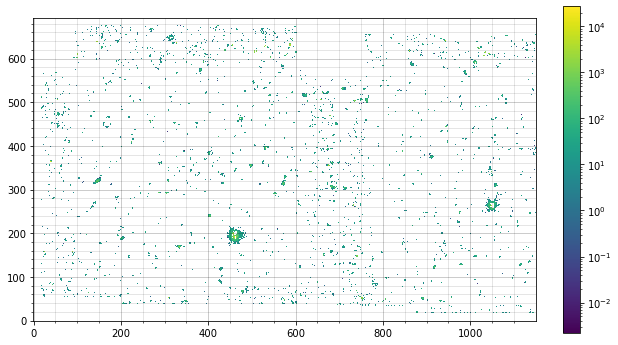

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1113.2673 22.366774 346.78254 12.676356    15.036755 0.061820199
  2 1043.0766 25.273232 346.77753 12.686997          nan         nan
  3 1024.0461 26.351823 346.77613 12.689863          nan         nan
  4 910.34866 29.041588 346.76834 12.707227          nan         nan
  5 1110.6247 34.620407 346.78043 12.675989    17.862596  0.28877952
  6 951.67974  35.01905 346.77007 12.700475    20.179535   2.9427539
  7 522.44462  40.67337 346.74135 12.766309          nan         nan
  8 732.91216 42.114825 346.75477 12.733762          nan         nan
  9 938.66314 43.373516 346.76791 12.701954          nan         nan
 10 268.15427 44.809232  346.7242  12.80526    20.806593   4.6685581
...       ...       ...       ...       ...          ...         ...
305 212.16574 654.45929 346.62418 12.775312          nan         nan
306 382.10645 653.61621 346.63534 

Number of PSF stars: 454


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


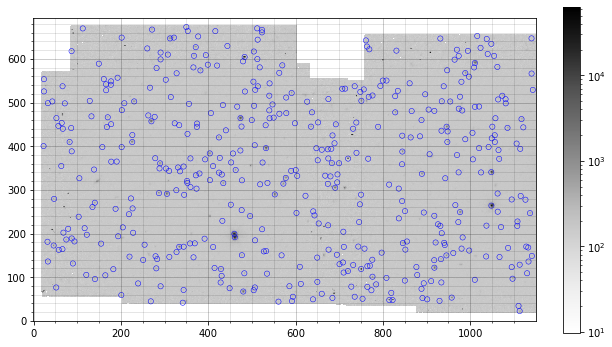

   x_0       y_0     id group_id
--------- --------- --- --------
1113.1595 22.451279   1        1
 1110.576 34.477862   2        1
 341.6405 41.658566   3        2
560.87114 44.062303   4        3
268.48831 44.776103   5        4
591.81442 45.373687   6        5
 593.9012  55.28431  16        5
929.67767 45.945275   7        6
814.56331 47.726273   8        7
 822.1875 47.685702   9        7
      ...       ... ...      ...
201.75307 648.70682 443      384
377.02118 651.38781 445      385
1016.0125 652.41988 446      386
523.04959 660.62457 447      387
523.14305 666.36055 451      387
512.14522 669.90084 453      387
416.29899 663.56713 448      388
353.20598 663.79397 449      389
349.86775 672.87062 454      389
271.39935 667.06511 450      390
112.68412 669.70243 452      391
Length = 454 rows


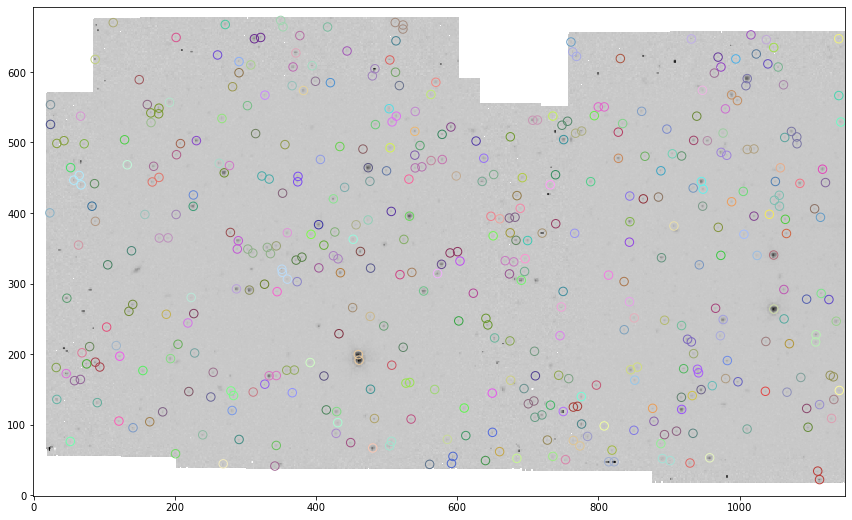

Time taken to fit PSF model: 13.791460200000017s


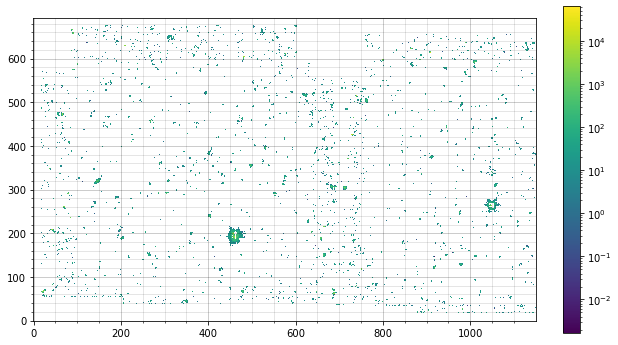

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1113.1595 22.451279 346.78254 12.676377    14.957129 0.050781151
  2  1110.576 34.477862 346.78047 12.676015    17.633107  0.53688894
  3  341.6405 41.658566 346.72944  12.79412    18.662787   1.1244427
  4 560.87114 44.062303 346.74329 12.760166          nan         nan
  5 268.48831 44.776103  346.7242 12.805201          nan         nan
  6 591.81442 45.373687 346.74509 12.755312    19.624076   1.3892376
 16  593.9012  55.28431 346.74366 12.754363    17.158648  0.14746682
  7 929.67767 45.945275 346.76693 12.703182    16.665852 0.089645745
  8 814.56331 47.726273 346.75918 12.720819    12.591951  0.21042955
  9  822.1875 47.685702 346.75968 12.719646     11.18426 0.058737541
...       ...       ...       ...       ...          ...         ...
319 201.87027 648.61256 346.62442 12.777226          nan         nan
320 161.57402 651.72629  346.6213 

Number of PSF stars: 460


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


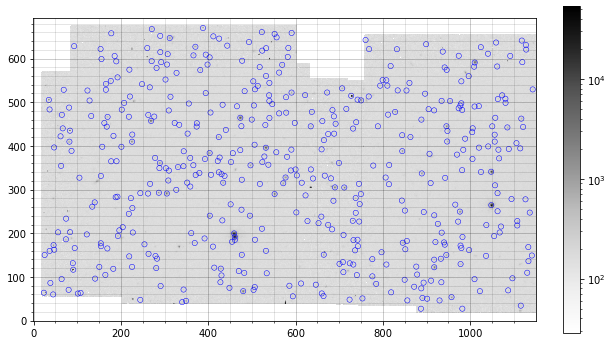

   x_0       y_0     id group_id
--------- --------- --- --------
887.14523 27.163445   1        1
981.87584 27.254784   2        2
1115.7612 34.210669   3        3
340.22905 42.271036   4        4
349.22138 45.155211   5        4
855.98042 46.170695   6        5
929.69611 46.075577   7        6
244.39469 47.456099   8        7
723.67836  47.96069   9        8
753.14408   50.7272  10        9
      ...       ... ...      ...
425.01971 645.69013 450      397
311.91313 647.02815 451      398
556.58695 648.51674 452      399
 551.9827 656.45568 455      399
411.75276 650.87941 453      400
290.07773  651.9257 454      401
177.98997 657.86569 456      402
590.99691 658.68508 457      403
522.79687 660.69251 458      404
270.88563 667.51745 459      405
388.05072  669.9599 460      406
Length = 460 rows


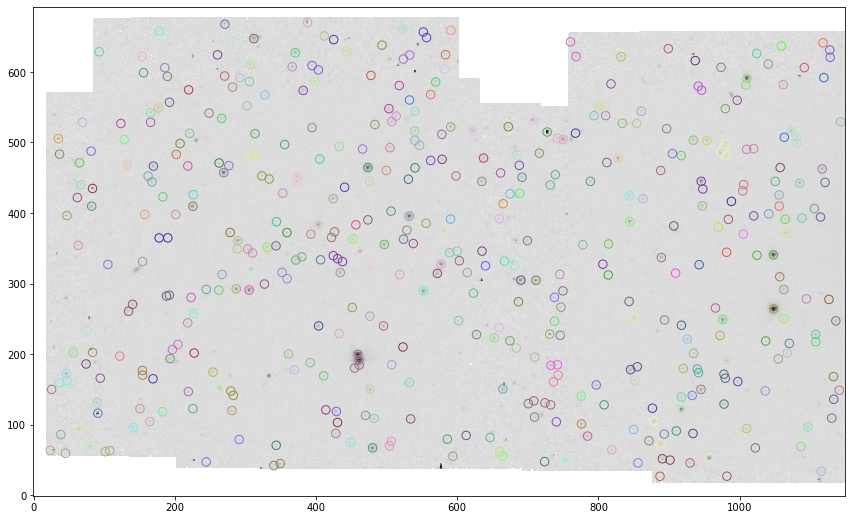

C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:716: RuntimeWarning: invalid value encountered in less
  invalid = (((xi < 0) | (xi > (self._nx - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:716: RuntimeWarning: invalid value encountered in greater
  invalid = (((xi < 0) | (xi > (self._nx - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:718: RuntimeWarning: invalid value encountered in less
  ((yi < 0) | (yi > (self._ny - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:718: RuntimeWarning: invalid value encountered in greater
  ((yi < 0) | (yi > (self._ny - 1)


Time taken to fit PSF model: 13.511884000000009s


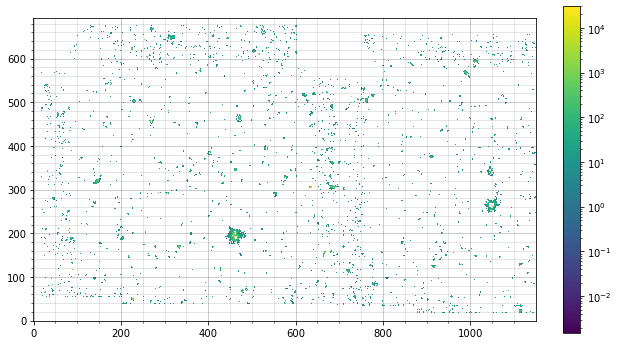

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 887.14523 27.163445 346.76719 12.710914          nan         nan
  2 981.87584 27.254784 346.77333 12.696304          nan         nan
  3 1115.7612 34.210669 346.78092 12.675222    17.594314  0.20010313
  4 340.22905 42.271036 346.72928 12.794273    18.564913  0.88250621
  5 349.22138 45.155211 346.72941 12.792704    16.065044 0.096604441
  6 855.98042 46.170695 346.76216 12.714515          nan         nan
  7 929.69611 46.075577 346.76696 12.703157     16.60462 0.095915723
  8 244.39469 47.456099 346.72224 12.808718          nan         nan
  9 723.67836  47.96069 346.75329 12.734799          nan         nan
 10 753.14408   50.7272 346.75477 12.730081    18.201241  0.33100674
...       ...       ...       ...       ...          ...         ...
303  411.7205 650.88906 346.63773 12.744679          nan         nan
304 290.18718 651.87701 346.62968 

Number of PSF stars: 461


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


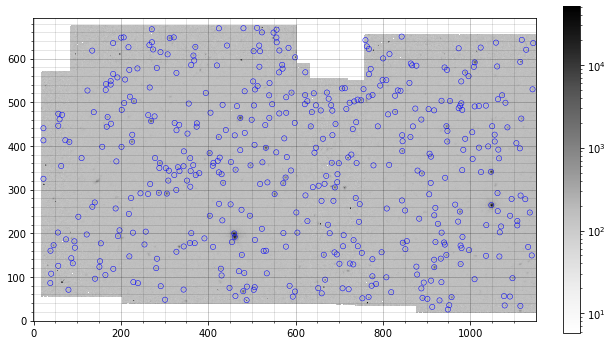

   x_0       y_0     id group_id
--------- --------- --- --------
948.75905 25.453016   1        1
951.94043 35.293048   5        1
913.00523 31.279954   2        2
1114.8041 33.639395   3        3
1078.8713 34.636959   4        4
 929.6402 46.215404   6        5
487.90863 46.760424   7        6
301.13567 47.760255   8        7
901.87225 49.699459   9        8
890.65268 52.010324  11        8
      ...       ... ...      ...
 321.1759 648.52315 452      388
200.73498 648.00741 450      389
206.37086 648.47768 451      389
842.94501 650.29573 454      390
522.95253 659.96342 455      391
549.51977 659.47302 456      392
556.49641 666.12573 457      392
270.80132 667.14563 458      393
424.55644 669.24435 459      394
480.67592 669.42743 460      395
511.81974 670.28021 461      396
Length = 461 rows


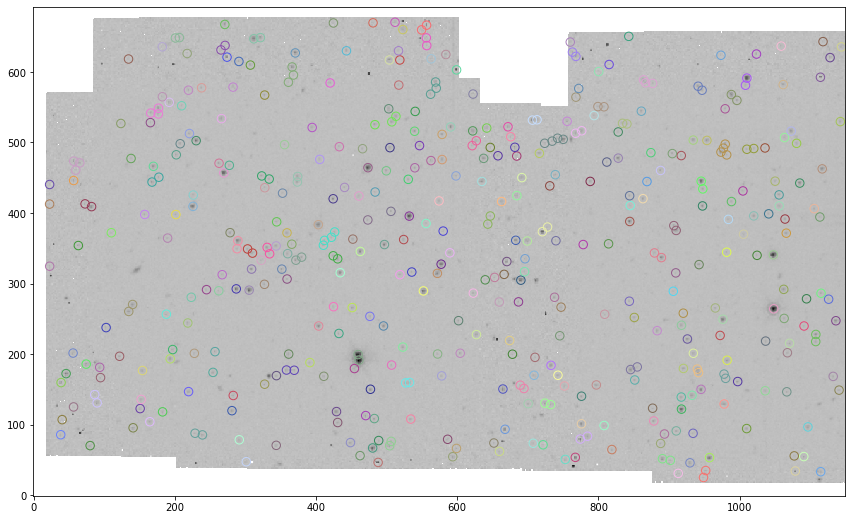

Time taken to fit PSF model: 13.543177100000037s


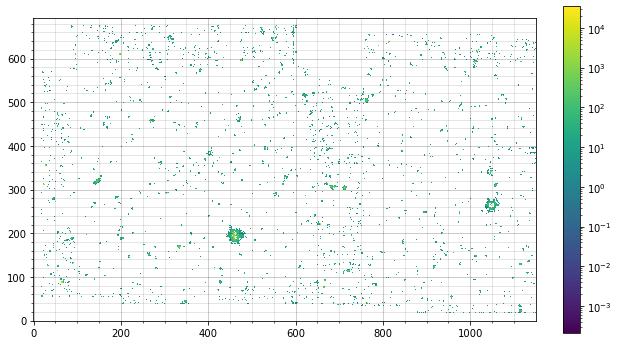

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 948.75905 25.453016 346.77146 12.701539          nan         nan
  5 951.94043 35.293048 346.77011 12.700425    19.056845  0.91495458
  2 913.00523 31.279954 346.76822 12.706681          nan         nan
  3 1114.8041 33.639395 346.78096 12.675423     17.66346  0.22986467
  4 1078.8713 34.636959 346.77846 12.680899     15.92947  0.10776318
  6  929.6402 46.215404 346.76694  12.70317    16.699191 0.098886168
  7 487.90863 46.760424 346.73815 12.771227    13.630692 0.073096771
  8 301.13567 47.760255 346.72585 12.799954          nan         nan
  9 901.87225 49.699459 346.76459  12.70723    19.540127   1.3830862
 11 890.65268 52.010324 346.76349 12.708813    15.939975 0.068301623
...       ...       ...       ...       ...          ...         ...
302 206.36556 648.49085 346.62474 12.776457          nan         nan
303 319.91459 648.10654 346.63219 

Number of PSF stars: 490


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


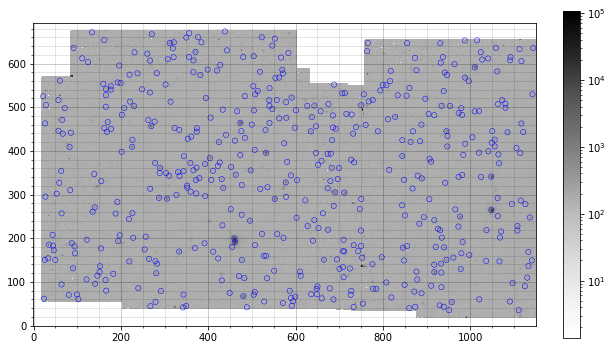

   x_0       y_0     id group_id
--------- --------- --- --------
951.62776 35.291831   1        1
1110.9097 35.092895   2        2
860.48479 39.779813   3        3
342.21921 41.605328   4        4
349.65657 44.907683  10        4
488.20827 41.944593   5        5
732.92263 42.723312   6        6
874.08261 43.129351   7        7
939.27377 43.210125   8        8
929.92022 46.345396  12        8
      ...       ... ...      ...
987.52272 652.90181 480      411
1015.7937 653.20069 481      412
162.06703 653.68802 482      413
552.40799 657.05182 483      414
349.83689 659.63695 484      415
356.47166  669.5897 488      415
522.49099 660.12893 485      416
376.53103 660.52765 486      417
270.73558 667.13722 487      418
134.13041 671.57021 489      419
438.34743 673.42203 490      420
Length = 490 rows


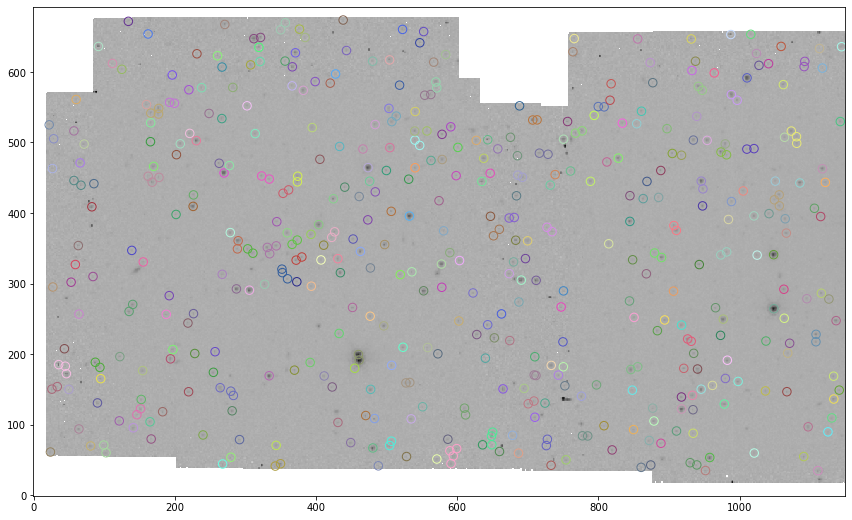

C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:716: RuntimeWarning: invalid value encountered in less
  invalid = (((xi < 0) | (xi > (self._nx - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:716: RuntimeWarning: invalid value encountered in greater
  invalid = (((xi < 0) | (xi > (self._nx - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:718: RuntimeWarning: invalid value encountered in less
  ((yi < 0) | (yi > (self._ny - 1)
C:\Users\Jake\anaconda3\lib\site-packages\photutils\psf\models.py:718: RuntimeWarning: invalid value encountered in greater
  ((yi < 0) | (yi > (self._ny - 1)


Time taken to fit PSF model: 14.917048099999988s


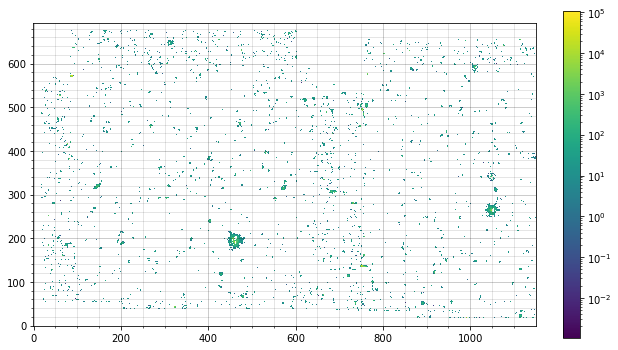

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 951.62776 35.291831  346.7701  12.70054    19.029766  0.88292043
  2 1110.9097 35.092895 346.78048 12.676002    17.016341  0.12439898
  3 860.48479 39.779813 346.76346 12.714303          nan         nan
  4 342.21921 41.605328 346.72947 12.794066    19.572169   2.0065852
 10 349.65657 44.907683 346.72943  12.79271    15.901694 0.086914506
  5 488.20827 41.944593 346.73891 12.771544          nan         nan
  6 732.92263 42.723312  346.7547 12.733778          nan         nan
  7 874.08261 43.129351 346.76382 12.711995          nan         nan
  8 939.27377 43.210125 346.76804 12.701942          nan         nan
 12 929.92022 46.345396 346.76694 12.703185     16.86184 0.097665885
...       ...       ...       ...       ...          ...         ...
316 384.59937 648.67962  346.6363 12.749002          nan         nan
317 162.21319 653.68039 346.62102 

Number of PSF stars: 455


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


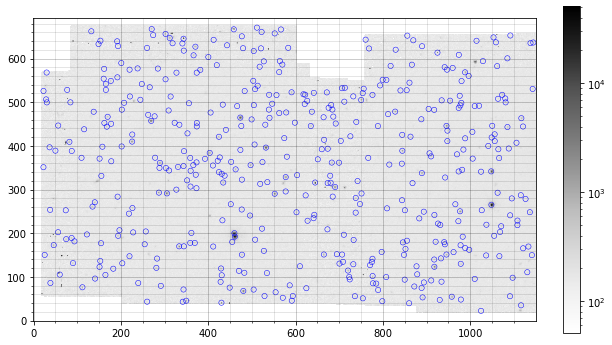

   x_0       y_0     id group_id
--------- --------- --- --------
1024.7212 22.285678   1        1
1116.3361 34.958871   2        2
860.07365 39.726432   3        3
430.24517  40.99787   4        4
341.61832  43.11308   5        5
 349.6498 45.514297   7        5
260.12942 43.287092   6        6
591.36981 45.569472   8        7
593.73996 56.284149  17        7
798.58098 44.382828   9        8
      ...       ... ...      ...
 855.9317 652.48438 445      387
1091.8964 652.82142 446      388
 273.9252 653.64564 447      389
 302.2679 656.53244 448      390
552.16502 657.61049 449      391
522.25839 660.89762 450      392
132.33442 662.46265 451      393
  458.522 666.93777 452      394
566.58905 666.62122 453      395
270.60355 667.52828 454      396
511.60589 670.79653 455      397
Length = 455 rows


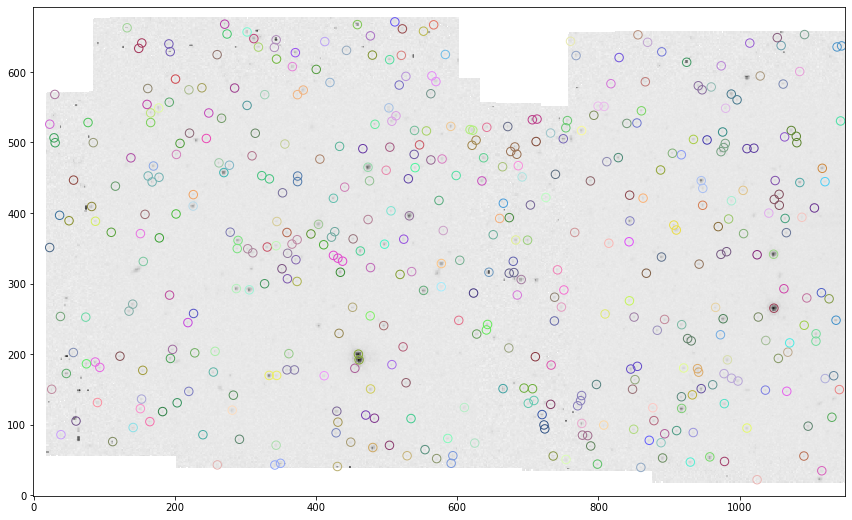

In [ ]:
print('Photometry method selected: {}'.format(method))

###   INITIALISING IMAGE WE'LL BE COMPARING OTHER EPOCHS TO WHEN STAR MATCHING   ###

epoch = 1  # counter to be incremented every epoch
LC_time = []

huge_table = copy.copy(master_stars['id_master', 'x_0', 'y_0', 'RA', 'dec'])

epsf_file = 'epsf_models/PAL13/epsf_'+channel+'_'+str(model_epoch)+'.pickle'
pickle_in = open(epsf_file, 'rb')
epsf = pickle.load(pickle_in)

norm = simple_norm(epsf.data, 'log', percent=99.)
plt.imshow(epsf.data, norm=norm, origin='lower', cmap='inferno')
plt.colorbar()
plt.show()

for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    
    #filename = base_dir+'PAL13__e8/PAL13__e8_3p6um.fits'
    #print(filename)
    
    ###   OPENING FITS FILE AND CONVERTING TO COUNTS   ###
    
    with fits.open(filename) as hdu_list:        
        print(filename)
        image_data = hdu_list[0].data
        hdr = hdu_list[0].header
        exptime = hdr['EXPTIME']
        fluxconv = hdr['FLUXCONV']
        conv = exptime / fluxconv
        print('EXPTIME: {0}\nFLUXCONV: {1}'.format(exptime, fluxconv))
        data = image_data * conv
    
    if channel == '4p5um':
        data = data[:,0:1150]
    
    file_corr = base_dir+'PAL13__e'+str(epoch)+'/PAL13__e'+str(epoch)+'_correction_'+channel+'.fits'
    with fits.open(file_corr) as hdu_list:
        data_corr = hdu_list[0].data
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
        
    mean, median, std = sigma_clipped_stats(data, sigma=sigma_level)
    print('Mean: {0}\nMedian: {1}\nStd dev: {2}'.format(mean, median, std))
    
    
    
    if method == 'aperture':
    
        ###   LOCATING STARS AND PLOTTING THEM   ###
        # could maybe put most of this in its own starfind function? including aperture and position bits

        sources = star_find(data, sigma_level, FWHM, std, roundness, sharphi)
        #sources = star_find(data, 300., FWHM, std, roundness, sharphi)
        pos = np.transpose((sources['xcentroid'], sources['ycentroid']))
        apertures = CircularAperture(pos, r_ap)
        annuli = CircularAnnulus(pos, r_in, r_out)
        print('No. of stars detected: {0}'.format(len(sources)))
        plotting(data, apertures, annuli, 'Greys', choice='both_aps', savename=None)
        
        #starlist = np.array(sources['xcentroid', 'ycentroid'])
        #np.savetxt('outputs/PAL13/starlist_02.txt', starlist, delimiter=',')

        ###   DOING APERTURE PHOTOMETRY   ###

        phot_table = ap_phot(data, apertures, annuli, 'median')
        
        phot_table['apparent_mag'] = float('NaN')
        phot_table['mag_err'] = float('NaN')
        for i in range(len(phot_table)):
            locorr = data_corr[int(phot_table['ycenter'][i].value)][int(phot_table['xcenter'][i].value)]  # location-dependent correction at star's location
            if phot_table['star_bkgsub'][i] >= 0:
                phot_table['apparent_mag'][i] = zmag - 2.5 * math.log10(apcorr * locorr * phot_table['star_bkgsub'][i] / conv)
                phot_table['mag_err'][i] = apparent_magnitude_err(phot_table['star_bkgsub'][i], apcorr, zmag_err, phot_table['counts_err'][i], apcorr_err)
        
        phot_table.write('outputs/PAL13/table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True)
        #print_table_nicely(phot_table)
        print_table_nicely(phot_table['id', 'xcenter', 'ycenter', 'star_bkgsub', 'counts_err', 'apparent_mag', 'mag_err'])
        
        match_table = copy.copy(phot_table)
        del match_table['aperture_sum_0', 'aperture_sum_1', 'bkg_sum_median', 'star_bkgsub', 'counts_err']
        mag_name = 'mag_e'+str(epoch)
        err_name = 'err_e'+str(epoch)
        match_table.rename_column('apparent_mag', mag_name)
        match_table.rename_column('mag_err', err_name)
        
        


    
    elif method == 'PSF':
        
        ###   DETECTING MORE STARS   ###
        
        sources_PSF = star_find(data, sigma_level, FWHM, std, roundness, sharphi=0.85)
        
        sources_PSF['xcentroid', 'ycentroid'].write('outputs/PAL13/epoch_'+str(epoch)+'_list_test.txt', format='csv', overwrite=True)
        
        #sources_PSF = star_find(data, sigma_level, FWHM, std, roundness, sharphi)
        pos_PSF = np.transpose((sources_PSF['xcentroid'], sources_PSF['ycentroid']))
        ap_PSF = CircularAperture(pos_PSF, r_ap)
        #plotting(data, ap_PSF, an=None, cmap='Greys', choice='ap_only', savename='psf_detect_test_00.png')
        print('Number of PSF stars: {}'.format(len(sources_PSF)))
        
        ###   MASKING BRIGHT REGION IN CHANNEL 2   ###

        if channel == '4p5um':
            x_mask = sources_PSF['xcentroid']
            y_mask = sources_PSF['ycentroid']
            del sources_PSF
            xlim = 1150
            mask_m = (x_mask < xlim)
            sources_PSF = Table()
            sources_PSF['xcentroid'] = x_mask[mask_m]
            sources_PSF['ycentroid'] = y_mask[mask_m]

            pos_mask = np.transpose((sources_PSF['xcentroid'], sources_PSF['ycentroid']))
            ap_mask = CircularAperture(pos_mask, r_ap)
            plotting(data, ap_mask, an=None, cmap='Greys', choice='ap_only', savename=None)
        
        ###   GROUPING STARS BASED ON PROXIMITY TO NEIGHBOURS   ###
        
        sources_PSF['xcentroid'].name = 'x_0'
        sources_PSF['ycentroid'].name = 'y_0'
        daogroup = DAOGroup(crit_separation=2.5*FWHM)
        #daogroup = DAOGroup(crit_separation=4*FWHM)
        star_groups = daogroup(sources_PSF)
        star_groups = star_groups.group_by('group_id')
        print_table_nicely(star_groups)
        
        ncolors = max(star_groups['group_id'])
        cmap = make_random_cmap(ncolors=ncolors, seed=1612)
        plt.imshow(data, origin='lower', norm=LogNorm(), interpolation='nearest', cmap='Greys')
        for i, group in enumerate(star_groups.groups):
            pos_group = np.transpose([group['x_0'], group['y_0']])
            ap_group = CircularAperture(pos_group, r_ap)
            ap_group.plot(color=cmap.colors[i], lw=1.)
        plt.gcf().set_size_inches(15, 9)
        plt.show()
        
        ###   ALIGNING MASTER STAR POSITIONS WITH EPOCH FRAME   ###
        # currently not using this part, but i've left it just in case i revert back
        
        '''transf, (src_list, trg_list) = aa.find_transform(data_m, data)
        #master_xy = np.array([(master_stars['x_0'], master_stars['y_0'])])
        master_xy = np.transpose((master_stars['x_0'], master_stars['y_0']))
        transf_list = aa.matrix_transform(master_xy, transf.params)
        print(len(transf_list))
        print(transf_list)'''
        
        ###   DOING PSF PHOTOMETRY   ###
        
        data_nonans = np.nan_to_num(data, nan=0.00001, copy=True) # changing NaN values to a float so PSF fit doesn't crash
        
        #bkg_estimation = MMMBackground()
        #fitter = LevMarLSQFitter()
        daofind_PSF = DAOStarFinder(threshold=sigma_level*std, fwhm=FWHM, roundlo=-roundness, roundhi=roundness, sharphi=0.85)
        fit_rad = 5
        
        epsf.x_0.fixed = True
        epsf.y_0.fixed = True
        init_pos = Table(names=['x_0', 'y_0'], data=[sources_PSF['x_0'], sources_PSF['y_0']])
        #init_pos = Table(names=['x_0', 'y_0'], data=transf_list)
        
        start = time.perf_counter()
        PSF_photometry = ISPSF(finder = daofind_PSF,
                              group_maker = daogroup,
                              bkg_estimator = MMMBackground(),
                              psf_model = epsf,
                              fitter = LevMarLSQFitter(),
                              fitshape = 2*fit_rad+1,
                              niters = 2,
                              aperture_radius = 6.)
        PSF_table = PSF_photometry(image=data_nonans, init_guesses=init_pos)
        residual_image = PSF_photometry.get_residual_image()
        print('Time taken to fit PSF model: {}s'.format(time.perf_counter() - start))
        
        plotting(residual_image, ap=None, an=None, cmap='viridis', choice=None, savename=None)
        
        PSF_table['apparent_mag'] = float('NaN')
        PSF_table['mag_err'] = float('NaN')
        for i in range(len(PSF_table)):
            locorr = data_corr[int(PSF_table['y_fit'][i])][int(PSF_table['x_fit'][i])]  # location-dependent correction at star's location
            if PSF_table['flux_fit'][i] >= 0:
                PSF_table['apparent_mag'][i] = zmag - 2.5 * math.log10(apcorr * locorr * PSF_table['flux_fit'][i] / conv)
                PSF_table['mag_err'][i] = apparent_magnitude_err(PSF_table['flux_fit'][i], apcorr, zmag_err, PSF_table['flux_unc'][i], apcorr_err)
        
        
        cat, ra, dec = make_catalog(PSF_table['x_fit'], PSF_table['y_fit'], hdr)
        PSF_table['RA'] = ra
        PSF_table['dec'] = dec
        
        #print_table_nicely(PSF_table['id', 'group_id', 'iter_detected', 'x_fit', 'y_fit', 'apparent_mag', 'mag_err'])
        print_table_nicely(PSF_table['id', 'x_fit', 'y_fit', 'RA', 'dec', 'apparent_mag', 'mag_err'])
        PSF_table['id', 'RA', 'dec', 'x_fit', 'y_fit', 'apparent_mag', 'mag_err'].write('outputs/PAL13/matching/'+method+'_'+channel+'_matching_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')
        
        save_name_ep = 'phot_tables/PAL13/epochs/phot_table_'+method+'_'+channel+'_e'+str(epoch)+'.pickle'
        pickle_out_ep = open(save_name_ep, 'wb')
        pickle.dump(PSF_table, pickle_out_ep)
        pickle_out_ep.close()
        
        match_table = copy.copy(PSF_table)
        del match_table['x_0', 'y_0', 'flux_0', 'flux_fit', 'flux_unc', 'iter_detected']
        mag_name = 'mag_e'+str(epoch)
        err_name = 'err_e'+str(epoch)
        match_table.rename_column('apparent_mag', mag_name)
        match_table.rename_column('mag_err', err_name)
        match_table.rename_column('x_fit', 'xcenter')
        match_table.rename_column('y_fit', 'ycenter')
        
        
    
    
    ###   COMPARING AGAINST MASTER LIST   ###

    comp_table = copy.copy(huge_table)
    #del comp_table['sharpness', 'roundness1', 'roundness2', 'npix', 'sky', 'peak', 'flux', 'mag']
    #comp_table['id', 'RA', 'dec', 'xcenter', 'ycenter', 'apparent_mag', 'mag_err'].write('outputs/PAL13/comp_table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')

    cat_match, ra, dec = make_catalog(match_table['xcenter'], match_table['ycenter'], hdr)
    match_table['RA'] = ra
    match_table['dec'] = dec
    #match_table['id', 'RA', 'dec', 'xcenter', 'ycenter', 'apparent_mag', 'mag_err'].write('outputs/PAL13/match_table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')

    idx, d2d, d3d = cat_match.match_to_catalog_sky(cat_m)

    # Selection criteria:
    max_sep = 0.25 * u.arcsec
    selection = (d2d > max_sep)
    match_index = idx
    match_index[selection] = -99.
    ind = ((match_index >= 0))  # keeps only positive indices (ie. removes -99s)
    #sumind = sum(ind)
    #print('Number of common stars: {}'.format(sumind))

    match_table = match_table[ind]
    comp_table = comp_table[match_index][ind]
    #print_table_nicely(match_table['id', 'RA', 'dec', 'apparent_mag', 'mag_err'])
    #print_table_nicely(comp_table['id_master', 'RA', 'dec'])

    match_table['id_master'] = comp_table['id_master']

    match_table = Table(match_table, masked=True)

    huge_table = join(huge_table, match_table['id_master', mag_name, err_name], keys='id_master', join_type='left')
    print_table_nicely(huge_table)
    
    print('\n\n\n')
    
    if run_all == False:
        break
    
    #if epoch == 2:
    #    break
    
    epoch += 1
    
###   CALCULATING VARIABILITY INDICES AND AMPLITUDE FOR EACH STAR   ###

if run_all == True:
    
    masked_array = np.ma.array(np.zeros(len(huge_table)), mask=True)
    huge_table['amp'] = masked_array
    huge_table['eta_inv'] = masked_array
    huge_table['IQR'] = masked_array
    huge_table['chi_sq'] = masked_array

    huge_table_f = copy.copy(huge_table.filled(-99))

    for i in range(len(huge_table_f)):
        #print(i)

        # Putting magnitudes into an array so we can play with them:
        mags = []
        errs = []
        for j in range(1,13):
            mags.append(huge_table_f['mag_e'+str(j)][i])
            errs.append(huge_table_f['err_e'+str(j)][i])

        mags = np.ma.array(mags)
        mags = np.ma.masked_where(mags == -99, mags)
        errs = np.ma.array(errs)
        errs = np.ma.masked_where(errs == -99, errs)

        # Calculating amplitude:
        if mags.compressed().size:    # doesn't calculate anything extra if the star has no magnitude data
            # Amplitude:
            amp = max(mags.compressed()) - min(mags.compressed())
            huge_table['amp'][i] = amp

            # Chi squared test:
            mean_sum1 = sum((m / e**2) for m, e in zip(mags.compressed(), errs.compressed()))
            mean_sum2 = sum((1. / e**2) for e in errs.compressed())
            mean_chi = mean_sum1 / mean_sum2

            chi_sq = sum(((m - mean_chi) / e)**2 for m, e in zip(mags.compressed(), errs.compressed()))
            huge_table['chi_sq'][i] = chi_sq

            # IQR:
            mags_sorted = sorted(mags.compressed())
            if len(mags_sorted) > 5:  # finding IQR for fewer than 6 values is pointless really, and can cause issues
                if len(mags_sorted) % 2 == 1:   # if odd number of entries, remove the median
                    mags_sorted.pop(int(len(mags_sorted)/2))

                mags_split= np.array_split(mags_sorted, 2)
                mags_lo = mags_split[0]
                mags_hi = mags_split[1]

                n = int(len(mags_lo) / 2)
                q25 = (mags_lo[n-1] + mags_lo[n]) / 2
                q75 = (mags_hi[n-1] + mags_hi[n]) / 2
                iqr = q75 - q25
                huge_table['IQR'][i] = iqr

            # von Neumann index:
            # (VERY important this is run LAST out of all the indices, otherwise 'continue' may skip them)
            var = sum((m - np.mean(mags.compressed()))**2 for m in mags.compressed()) / (len(mags.compressed()) - 1)
            diff = 0
            for k in range(len(mags.compressed()) - 1):
                diff += (mags.compressed()[k+1] - mags.compressed()[k])**2
            if (len(mags.compressed()) - 1) == 0:
                continue
            mssd = diff / (len(mags.compressed()) - 1)
            if mssd == 0. or var == 0.:
                continue
            eta_inv = var / mssd
            huge_table['eta_inv'][i] = eta_inv
        



    print_table_nicely(huge_table)

    if method == 'aperture':
        save_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
    elif method == 'PSF':
        save_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

    pickle_out = open(save_name, 'wb')
    pickle.dump(huge_table, pickle_out)
    pickle_out.close()    



In [15]:
huge_table.show_in_notebook()

idx,id_master,x_0,y_0,RA,dec,mag_e1,err_e1,mag_e2,err_e2,mag_e3,err_e3,mag_e4,err_e4,mag_e5,err_e5,mag_e6,err_e6,mag_e7,err_e7,mag_e8,err_e8,mag_e9,err_e9,mag_e10,err_e10,mag_e11,err_e11,mag_e12,err_e12,amp,eta_inv,IQR,chi_sq
0,0,1023.3861,21.336295,346.72948,12.794099,--,--,18.002199,0.22123961,--,--,--,--,--,--,--,--,--,--,--,--,--,--,18.037454,0.20287613,17.911309,0.1716912,--,--,0.12614505,0.49384477,--,0.24739704
1,1,1030.6396,24.900292,346.72939,12.792755,15.754222,0.043403378,15.796931,0.04151602,--,--,15.87715,0.036833349,15.840122,0.03965267,15.814421,0.041440745,--,--,15.925013,0.045077949,15.956891,0.046229977,15.990905,0.045524769,15.917247,0.042029943,15.885365,0.041995951,0.23668303,1.6090404,0.1154536,26.066344
2,2,1172.343,21.167364,346.73926,12.77118,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--
3,3,949.26181,24.567034,346.72411,12.805304,17.773514,0.084026703,--,--,--,--,18.161456,0.10690646,--,--,--,--,--,--,17.982331,0.07986602,--,--,--,--,--,--,17.818652,0.081215239,0.38794171,0.44481307,--,10.25607
4,4,1153.1168,25.51441,346.73732,12.773862,18.328259,0.10540509,--,--,--,--,--,--,--,--,--,--,18.737962,0.2042863,--,--,--,--,--,--,--,--,--,--,0.40970297,0.5,--,3.1765062
5,5,1272.4713,26.122891,346.74504,12.755449,17.692206,0.076848844,--,--,--,--,17.473228,0.074773818,17.552398,0.080143282,--,--,--,--,17.690496,0.08468596,--,--,17.629981,0.075128696,17.650223,0.085703087,17.249552,0.061712621,0.44265409,0.63667148,0.3089695,33.081267
6,6,1275.3878,36.124401,346.74365,12.754361,--,--,--,--,16.749708,0.044165533,16.760576,0.045653128,16.748544,0.043571309,--,--,16.933748,0.050063708,16.799578,0.047375889,16.879547,0.050616018,16.801532,0.047170792,--,--,16.668405,0.043388766,0.26534224,0.57801163,0.091413179,21.380194
7,7,1280.4128,47.399125,346.7422,12.752868,--,--,--,--,--,--,--,--,17.621448,0.078735677,--,--,--,--,--,--,17.671997,0.067532842,17.58862,0.076827579,17.479162,0.067374683,--,--,0.19283551,0.93070555,--,4.3371322
8,8,1129.8404,29.485108,346.73517,12.777191,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,19.265378,0.29903073,--,--,--,--,--,--,0,--,--,0
9,9,1252.3323,32.110566,346.74278,12.758167,17.808359,0.084651292,--,--,--,--,--,--,18.398634,0.14945518,18.179725,0.098721769,17.937639,0.091814516,18.009582,0.13705808,18.186053,0.15400443,--,--,17.875475,0.086909825,--,--,0.59027514,0.44186652,0.34097223,19.475788


In [7]:
if method == 'aperture':
    load_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table = pickle.load(pickle_in)

#huge_table.show_in_notebook()

### Run this to add Welch-Stetson variability index to huge_table:

In [6]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)

cat_ch1 = SkyCoord(huge_table_ch1['RA'], huge_table_ch1['dec'], frame='icrs', unit='deg')
cat_ch2 = SkyCoord(huge_table_ch2['RA'], huge_table_ch2['dec'], frame='icrs', unit='deg')

idx, d2d, d3d = match_coordinates_sky(cat_ch1, cat_ch2)  # idx correspond to ch1

#print(len(idx))
#print(len(cat_ch1))

max_sep = 0.4 * u.arcsec  # looking at maximum distance between matching RA/dec coords, around 0.4 seems to work decently
selection = (d2d > max_sep)
match_index = idx
match_index[selection] = -99.
ind = ((match_index >= 0))  # keeps only positive indices (ie. removes -99s)

huge_table_ch1 = huge_table_ch1[ind]
huge_table_ch2 = huge_table_ch2[match_index][ind]
#print(len(huge_table_ch1))

id_list = np.arange(len(huge_table_ch1))
huge_table_ch1['id_match'] = id_list
huge_table_ch2['id_match'] = id_list

masked_array = np.ma.array(np.zeros(len(huge_table_ch1)), mask=True)
huge_table_ch1['I_var'] = masked_array
huge_table_ch2['I_var'] = masked_array

huge_table_ch1_f = copy.copy(huge_table_ch1.filled(-99))
huge_table_ch2_f = copy.copy(huge_table_ch2.filled(-99))

for i in range(len(huge_table_ch1)):
    #print(i)
    mags_ch1 = []
    mags_ch2 = []
    errs_ch1 = []
    errs_ch2 = []
    for j in range(1,13):
        mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][i])
        mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][i])
        errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][i])
        errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][i])

    mags_ch1 = np.ma.array(mags_ch1)
    mags_ch1 = np.ma.masked_where(mags_ch1 == -99, mags_ch1)
    mags_ch2 = np.ma.array(mags_ch2)
    mags_ch2 = np.ma.masked_where(mags_ch2 == -99, mags_ch2)
    errs_ch1 = np.ma.array(errs_ch1)
    errs_ch1 = np.ma.masked_where(errs_ch1 == -99, errs_ch1)
    errs_ch2 = np.ma.array(errs_ch2)
    errs_ch2 = np.ma.masked_where(errs_ch2 == -99, errs_ch2)
    
    m1_mean = np.mean(mags_ch1.compressed())
    m2_mean = np.mean(mags_ch2.compressed())
    n = len(mags_ch1)   # could also be len(mags_ch2)
    
    # probably need to do a for loop instead of list comprehension
    # check if number of mags in ch1 and ch2 list match; if not, don't calculate
    # doesn't guarantee that the mags are from the same epochs, even if the length matches; might need to only calculate for stars with 12 observations :/
    # unless we wanna get complicated and check that each list has values in the same places
    
    '''if len(mags_ch1.compressed()) == 12 and len(mags_ch2.compressed()) == 12:
        count += 1
        print('yay they are both big')
        
        I = sum((((m1-m1_mean)/e1) * ((m2-m2_mean)/e2)) for m1, m2, e1, e2 in zip(mags_ch1, mags_ch2, errs_ch1, errs_ch2)) * np.sqrt(1. / (n*(n-1)))

        print(len(mags_ch1.compressed()))
        print(len(mags_ch2.compressed()))
        print('I: ', I, '\n')

        huge_table_ch1['I_var'][i] = I
        huge_table_ch2['I_var'][i] = I'''
    
    I_prod = 0
    count_unmasked = 0
    
    for k in range(len(mags_ch1)):
        if np.ma.is_masked(mags_ch1[k]) == True:
            #print('ch1 is masked')
            continue
        elif np.ma.is_masked(mags_ch2[k]) == True:
            #print('ch2 is masked')
            continue
        else:
            #print('neither masked :)')
            count_unmasked += 1
            I_prod += ((mags_ch1[k] - m1_mean) / errs_ch1[k]) * ((mags_ch2[k] - m2_mean) / errs_ch2[k])
        
    #print('count unmasked: ', count_unmasked)
    if count_unmasked > 5:
        I = I_prod * np.sqrt(1. / n * (n - 1))
        #print('I: ', I)
        huge_table_ch1['I_var'][i] = I
        huge_table_ch2['I_var'][i] = I
    #else:
        #print('too few good values to calculate I :(')
    
    #print(huge_table_ch1['I_var'][i])
    #print('\n')


huge_table_var = join(huge_table, huge_table_ch1['id_master', 'I_var'], keys='id_master', join_type='left')

pickle_out = open(save_name, 'wb')
pickle.dump(huge_table_var, pickle_out)
pickle_out.close() 

huge_table_var

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_PSF_4p5um_model_emaster.pickle'

<ipython-input-70-7f55f072592f>:15: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


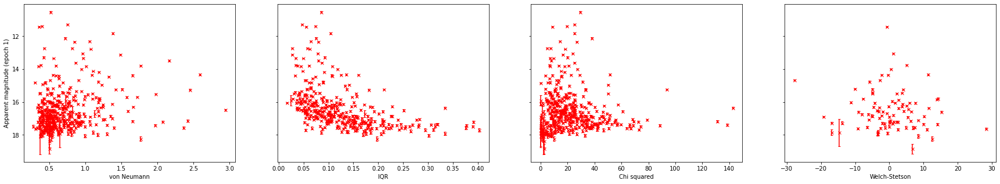

In [70]:
if method == 'aperture':
    load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table_var = pickle.load(pickle_in)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 5), sharey=True)
ax1.errorbar(huge_table_var['eta_inv'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax1.set(xlabel='von Neumann', ylabel='Apparent magnitude (epoch 1)')
ax1.invert_yaxis()
ax2.errorbar(huge_table_var['IQR'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax2.set(xlabel='IQR')
ax3.errorbar(huge_table_var['chi_sq'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax3.set(xlabel='Chi squared')
ax4.errorbar(huge_table_var['I_var'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax4.set(xlabel='Welch-Stetson')

fig.savefig('images/PAL13/variability/subplot_all.png', dpi=200)
fig.show()

In [7]:
if method == 'aperture':
    load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table_var = pickle.load(pickle_in)

huge_df = huge_table_var.to_pandas()

#huge_df['hue_key'] = huge_df['eta_inv']
huge_df['variable'] = 'no'

huge_df['hue_key'] = pd.qcut(huge_df['eta_inv'], q=3, labels=['low', 'medium', 'high'])
huge_df['hue_key'] = pd.Categorical(huge_df['hue_key'], categories=['low', 'medium', 'high', 'RRL']) # adding RRL category

#huge_df = huge_df.cat.add_categories(['RRL'])

if channel == '3p6um':
    huge_df['variable'][632] = 'RRL1'
    huge_df['variable'][37]  = 'RRL3'
    huge_df['variable'][617] = 'RRL5'
    huge_df['hue_key'][632, 37, 617] = 'RRL'
elif channel == '4p5um':
    huge_df['variable'][658] = 'RRL1'
    huge_df['variable'][506] = 'RRL2'
    huge_df['variable'][60]  = 'RRL3'
    huge_df['variable'][255] = 'RRL4'
    huge_df['variable'][640] = 'RRL5'
    huge_df['hue_key'][658, 506, 60, 255, 640] = 'RRL'



mega_plot = sns.pairplot(huge_df[['chi_sq', 'IQR', 'I_var', 'eta_inv', 'hue_key']], hue='hue_key', palette='CMRmap_r', markers=['.','.','.','X'], plot_kws={'s': 100})
mega_plot._legend.set_title('Variability (based on eta_inv)')

#mega_plot._legend.remove()

#mega_plot.savefig('images/PAL13/variability/best_mega_plot_'+channel+'.png', dpi=200)
#fig.show()

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_var_PSF_3p6um_model_emaster.pickle'

In [33]:
test_df = copy.copy(huge_df)

test_df['hue_key'] = pd.qcut(test_df['eta_inv'], q=3, labels=['low', 'medium', 'high'])

test_df

,id_master,x_0,y_0,RA,dec,mag_e1,err_e1,mag_e2,err_e2,mag_e3,...,err_e11,mag_e12,err_e12,amp,eta_inv,IQR,chi_sq,I_var,hue_key,variable
0,0,1269.506326,28.576869,229.063032,-0.156443,16.823971,0.058122,16.957007,0.063766,17.084344,...,0.055009,NaN,NaN,0.260373,0.840250,0.195389,16.441654,NaN,high,no
1,1,1140.273967,29.994286,229.066273,-0.135148,17.349971,0.056014,17.194467,0.059591,17.082898,...,0.054542,17.113198,0.069184,0.430835,1.107865,0.222677,54.222092,NaN,high,no
2,2,1302.532358,30.413832,229.061841,-0.161826,16.267656,0.078471,16.250014,0.076104,16.236939,...,0.073235,16.126407,0.078961,0.171981,0.511458,0.113137,5.883287,NaN,medium,no
3,3,799.686317,39.347906,229.073893,-0.078874,16.848318,0.058436,16.942163,0.049819,16.827258,...,0.054227,16.596978,0.050690,0.406429,0.740310,0.089322,36.915060,1.433951,high,no
4,4,1264.216151,40.472713,229.061217,-0.155253,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
860,860,1194.215089,651.154848,228.962650,-0.127318,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no
861,861,1071.982504,658.140967,228.964788,-0.107024,17.383965,0.116806,17.472029,0.102119,17.497485,...,0.072597,17.282309,0.065077,0.248917,0.368902,0.170279,12.395975,NaN,low,no
862,862,97.750837,659.597650,228.990744,0.053263,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no
863,863,1035.205090,659.595359,228.965537,-0.100936,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no


### Plotting light curves:

In [192]:
huge_table[42]

id_master,x_0,y_0,RA,dec,mag_e1,err_e1,mag_e2,err_e2,mag_e3,err_e3,mag_e4,err_e4,mag_e5,err_e5,mag_e6,err_e6,mag_e7,err_e7,mag_e8,err_e8,mag_e9,err_e9,mag_e10,err_e10,mag_e11,err_e11,mag_e12,err_e12,amp,eta_inv,IQR,chi_sq,I_var
int32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
42,1301.2541,72.788959,229.03964,-0.27308442,16.349562,0.04563458,16.404874,0.046907963,16.032159,0.04138899,16.049841,0.049844395,16.035945,0.045240074,16.151175,0.051656688,--,--,16.191655,0.048507879,--,--,16.462275,0.057430335,16.548584,0.052715551,16.063968,0.045322907,0.5164242,0.72910502,0.33432501,142.57134,--


data/PAL13\PAL13__e1\PAL13__e1_3p6um.fits
data/PAL13\PAL13__e2\PAL13__e2_3p6um.fits
data/PAL13\PAL13__e3\PAL13__e3_3p6um.fits
data/PAL13\PAL13__e4\PAL13__e4_3p6um.fits
data/PAL13\PAL13__e5\PAL13__e5_3p6um.fits
data/PAL13\PAL13__e6\PAL13__e6_3p6um.fits
data/PAL13\PAL13__e7\PAL13__e7_3p6um.fits
data/PAL13\PAL13__e8\PAL13__e8_3p6um.fits
data/PAL13\PAL13__e9\PAL13__e9_3p6um.fits
data/PAL13\PAL13__e10\PAL13__e10_3p6um.fits
data/PAL13\PAL13__e11\PAL13__e11_3p6um.fits
data/PAL13\PAL13__e12\PAL13__e12_3p6um.fits
[56524.37243767361, 56524.434811921295, 56524.496870393516, 56524.55862994213, 56524.62487443287, 56524.677250127315, 56524.73901320602, 56524.802780798615, 56524.86136105324, 56524.921150208334, 56524.98415725694, 56525.04442045139]
<SkyCoord (ICRS): (ra, dec) in deg
    (346.67975, 12.77994444)>
RRab
Star ID:  499
Mags:  [16.26661708 16.40336532 16.25561945 16.21357706 16.17212285 16.13067575
 16.20276925 16.24837544 16.28597434 16.43195094 16.5926465  16.52396536]
Errs:  [0.03268241

C:\Users\Jake\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:746: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


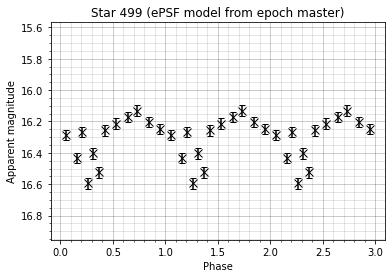

Amplitude:      0.4619707542014382
Chi squared:    195.28338314659624
IQR:            0.20948497928265297
von Neumann:    2.1682954387124647


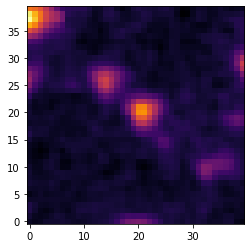

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


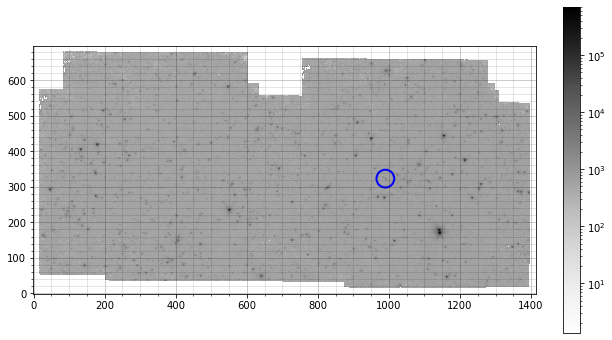

In [5]:
if method == 'aperture':
    #load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
    load_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    #load_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    load_name = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table = pickle.load(pickle_in)

LC_time = []
for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        print(filename)
        hdr = hdu_list[0].header
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
    
print((LC_time))

###################
cat_or_rand = 'cat'
###################

if cat_or_rand == 'cat':
    
    ###   FOR PLOTTING STAR FROM CATALOGUE   ###
    
    ################ # note: 4 only in ch1; 3 only in ch2
    desired_star = 2
    ################
    
    file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
    df_CC = pd.read_csv(file_CC, sep=',', header=0)
    if desired_star >= 5:
        ra_temp = df_CC['RA'][desired_star]
        dec_temp = df_CC['dec'][desired_star]
        #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
        c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
    else:
        c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])
        
    c_comp = SkyCoord(huge_table['RA']*u.degree, huge_table['dec']*u.degree)
    
    print(c_CC)
    
    if df_CC['type'][desired_star] == 'RR0':
        P = df_CC['period_fund'][desired_star]
        print('RRab')
    elif df_CC['type'][desired_star] == 'RR1':
        P = df_CC['period_FO'][desired_star]
        print('RRc')
    elif df_CC['type'][desired_star] == 'RR01':
        P = df_CC['period_FO'][desired_star]
        
    temp = [i / P for i in LC_time]
    phase = temp - np.floor(temp)  

    star_id, d2d, d3d = c_CC.match_to_catalog_sky(c_comp)
    print('Star ID: ', star_id)
    
    
else:
    
    ###   FOR PLOTTING RANDOM OR SPECIFIC STAR IN TABLE   ###

    #star_id = random.randint(0,len(huge_table))
    #star_id = 286
    star_id = 42
    print('Star ID: ', star_id)
    phase = LC_time
    #desired_star = -99


huge_table_f = copy.copy(huge_table.filled(-99))

mags = []
errs = []
for i in range(1,13):
    mags.append(huge_table_f['mag_e'+str(i)][star_id])
    errs.append(huge_table_f['err_e'+str(i)][star_id])
    
### Masking out a specific data point (only use in emergencies, or the Science Police will get you):

#remove_pls = 5  # EPOCH number of bad point
#mags[remove_pls-1] = -99
#print(mags)

###

mags = np.ma.array(mags)
mags = np.ma.masked_where(mags == -99, mags)
errs = np.ma.array(errs)
errs = np.ma.masked_where(errs == -99, errs)
phase = np.ma.masked_array(phase, mags.mask)
print('Mags: ', mags)
print('Errs: ', errs)
print('Phase: ', phase)

###   PLOTTING LIGHT CURVES   ###

mags_long = np.ma.concatenate((mags, mags, mags))  # this idea taken from some of vicky's code; credit?
errs_long = np.ma.concatenate((errs, errs, errs))
phase_long = np.ma.concatenate((phase, phase + 1., phase + 2.))

plt.errorbar(phase_long, mags_long, yerr=errs_long, fmt='x', color='black', capsize=3, markersize=8)
plt.ylim(np.nanmedian(mags) - 1.5*(max(mags)-min(mags)), np.nanmedian(mags) + 1.5*(max(mags)-min(mags)))
#plt.xlim(0, 1)
plt.gca().invert_yaxis()
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
if cat_or_rand == 'cat':
    plt.xlabel('Phase')
else:
    plt.xlabel('Observation time')
plt.ylabel('Apparent magnitude')
plt.title('Star '+str(star_id)+' (ePSF model from epoch '+str(model_epoch)+')')
#plt.savefig('images/PAL13/curves/'+method+'_'+channel+'_'+str(star_id)+'_'+str(model_epoch)+'.png', dpi=100)
plt.show()

###   GAIA DR2 CURVE COMPARISON   ###

'''vot_name = 'data/curves/proc_RRL'+str(desired_star+1)+'.vot'

if os.path.isfile(vot_name) == True:
    
    votable = parse_single_table(vot_name)
    data_vot = votable.array

    temp = [i / P for i in data_vot['obs_time']]
    phase_vot = temp - np.floor(temp)

    mags_vot = np.concatenate((data_vot['phot'], data_vot['phot'], data_vot['phot']))
    phases_vot = np.concatenate((phase_vot, phase_vot + 1., phase_vot + 2.))

    plt.plot(phases_vot, mags_vot, 'kx')
    plt.xlabel('Phase')
    plt.ylabel('Magnitude')
    plt.gca().invert_yaxis()
    plt.title('Gaia curve for RRL'+str(desired_star+1))
    plt.savefig('images/PAL13/curves/gaia/RRL'+str(desired_star+1), dpi=200)
    plt.show()'''

###   PRINTING VARIABILITY INFORMATION ETC.   ###

print('Amplitude:     ', huge_table['amp'][star_id])
print('Chi squared:   ', huge_table['chi_sq'][star_id])
print('IQR:           ', huge_table['IQR'][star_id])
#print('Welch-Stetson: ', huge_table['I_var'][star_id])
print('von Neumann:   ', huge_table['eta_inv'][star_id])

###   PLOTTING IMAGE OF STAR FROM MASTER FRAME   ###

star_r = 20
star_x = int(huge_table['x_0'][star_id])
star_y = int(huge_table['y_0'][star_id])
star_ap = CircularAperture((star_x, star_y), r=25.)

region = data_m[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal')
#star_ap.plot(color='white')
plt.show()

plt.imshow(data_m, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
star_ap.plot(color='blue', lw=2.)
plt.colorbar(fraction = 0.05)
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gcf().set_size_inches(10, 6)
plt.show()

#plotting(data_m, star_ap, an=None, cmap='Greys', choice='ap_only', savename=None)

### Looking at a star in all epochs:

RRL2:
Even though magnitudes from epochs 2, 3, 7, 8 are missing when joined with master table, from manual inspection only epochs 2 and 8 mistake another star for RRL2

<SkyCoord (ICRS): (ra, dec) in deg
    (229.03964, -0.27308442)>
RRab
data/PAL5\PAL5__e1\PAL5__e1_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e1.pickle
Star ID:  24
 x_fit    y_fit       RA        dec      flux_fit apparent_mag
------- --------- --------- ----------- --------- ------------
1299.43 69.695309 229.03964 -0.27309686 3118.8295    16.349562


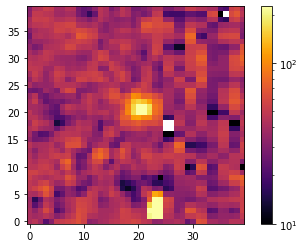

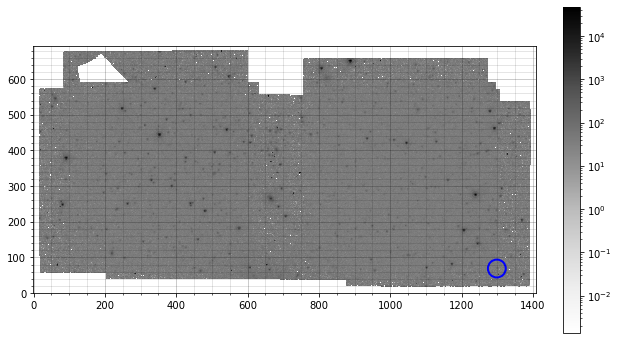




data/PAL5\PAL5__e2\PAL5__e2_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e2.pickle
Star ID:  32
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1299.7606 69.569697 229.03964 -0.27313579 2964.3213    16.404874


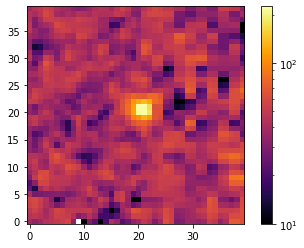

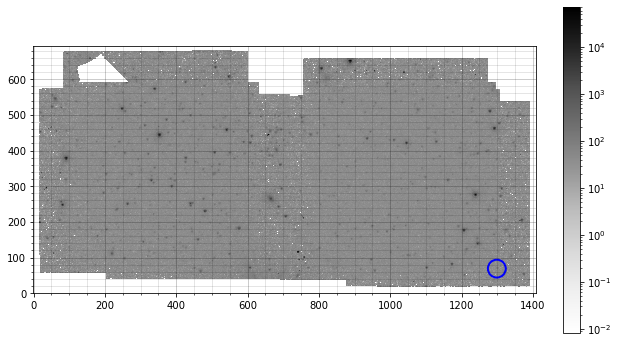




data/PAL5\PAL5__e3\PAL5__e3_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e3.pickle
Star ID:  27
  x_fit     y_fit      RA        dec      flux_fit apparent_mag
--------- --------- -------- ----------- --------- ------------
1299.6086 70.993556 229.0396 -0.27310011 4178.4049    16.032159


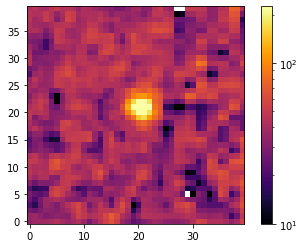

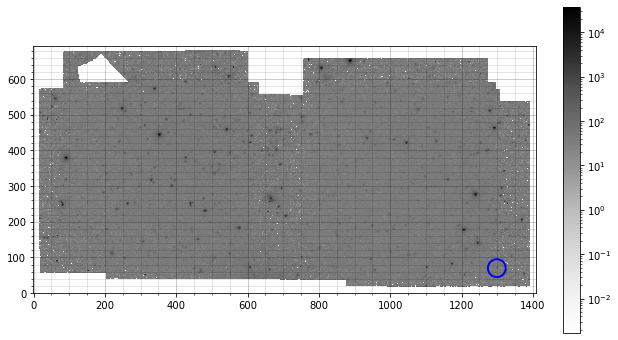




data/PAL5\PAL5__e4\PAL5__e4_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e4.pickle
Star ID:  22
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1299.8416 70.422062 229.03963 -0.27310822 4111.4988    16.049841


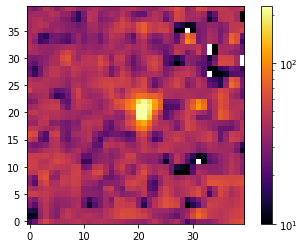

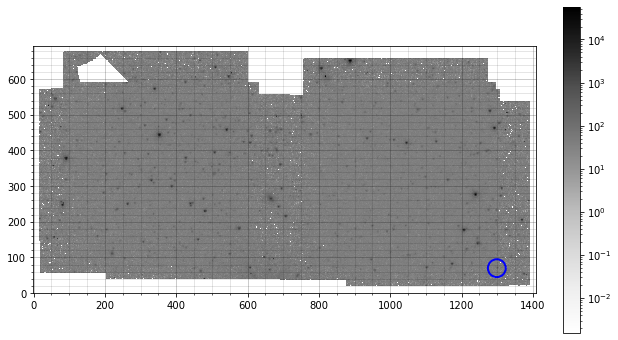




data/PAL5\PAL5__e5\PAL5__e5_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e5.pickle
Star ID:  23
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1300.0078 70.234935 229.03964 -0.27310465 4165.1616    16.035945


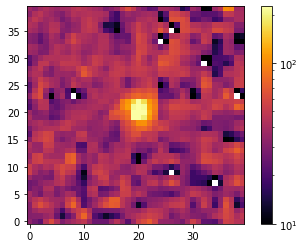

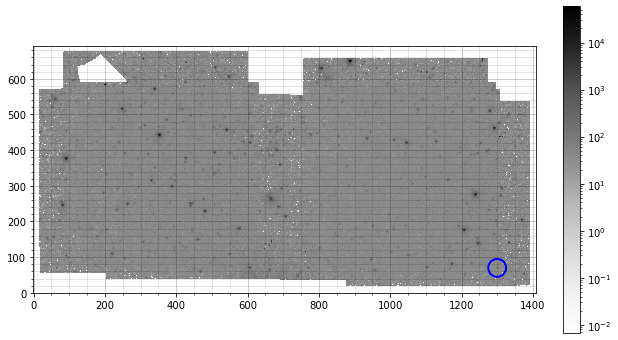




data/PAL5\PAL5__e6\PAL5__e6_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e6.pickle
Star ID:  33
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1300.0226 71.162712 229.03963 -0.27306674 3745.3869    16.151175


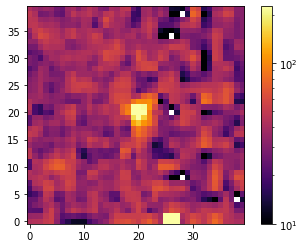

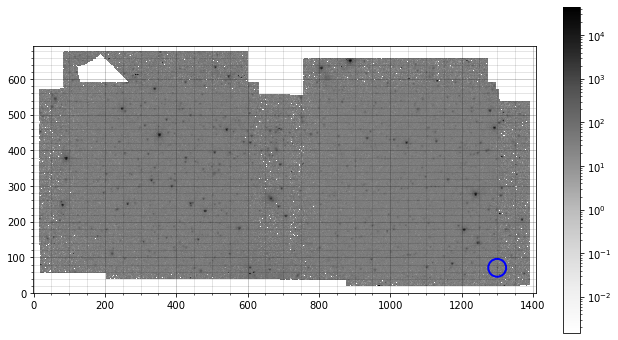




data/PAL5\PAL5__e7\PAL5__e7_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e7.pickle
Star ID:  10
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1314.7371 47.530884 229.04329 -0.27612615 771.74754    17.858047


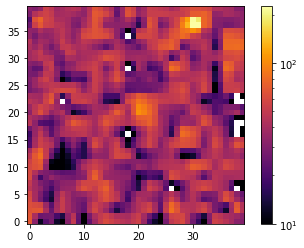

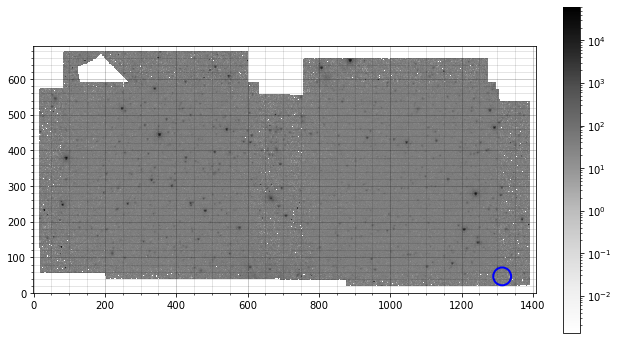




data/PAL5\PAL5__e8\PAL5__e8_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e8.pickle
Star ID:  32
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1300.0981 72.338439 229.03965 -0.27304324 3608.3862    16.191655


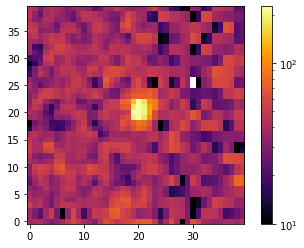

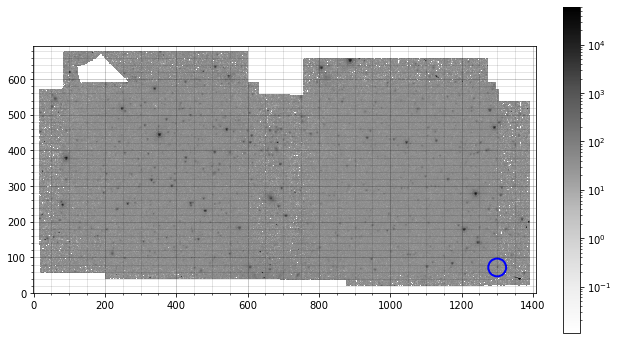




data/PAL5\PAL5__e9\PAL5__e9_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e9.pickle
Star ID:  21
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1300.1791 72.349861 229.03968 -0.27302516 3566.2067    16.204496


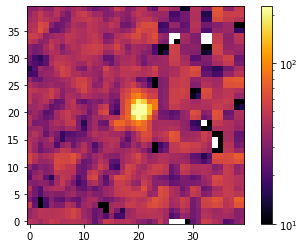

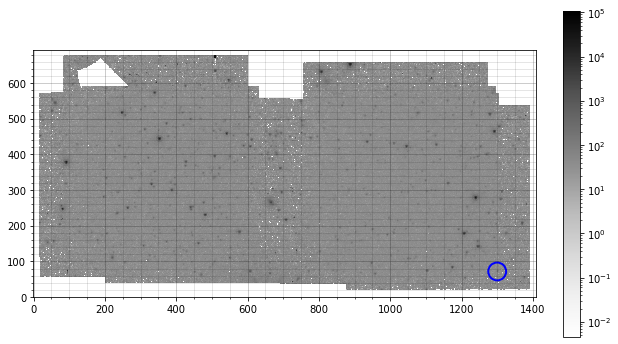




data/PAL5\PAL5__e10\PAL5__e10_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e10.pickle
Star ID:  26
  x_fit     y_fit       RA       dec      flux_fit apparent_mag
--------- --------- --------- ---------- --------- ------------
1300.6198 72.785574 229.03964 -0.2730532 2812.2426    16.462275


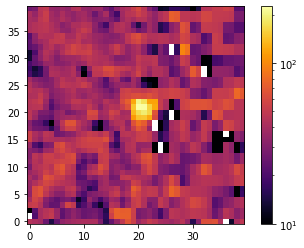

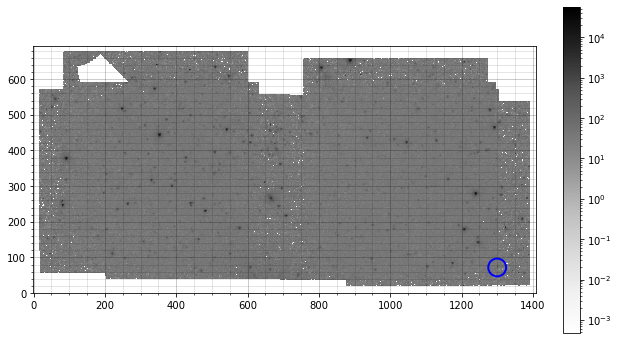




data/PAL5\PAL5__e11\PAL5__e11_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e11.pickle
Star ID:  35
  x_fit     y_fit       RA        dec      flux_fit apparent_mag
--------- --------- --------- ----------- --------- ------------
1301.1041 72.682065 229.03962 -0.27309396 2597.8604    16.548584


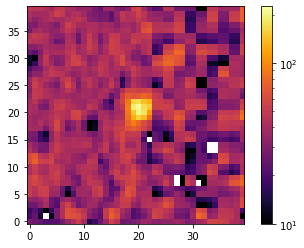

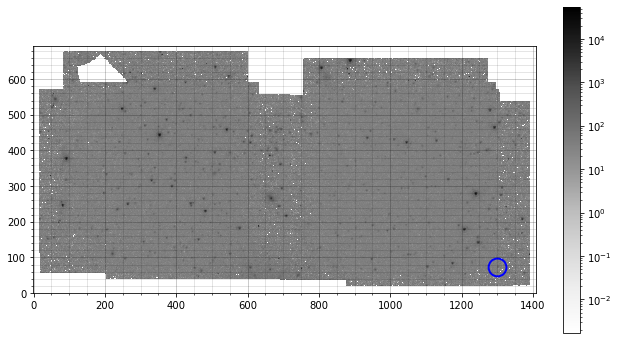




data/PAL5\PAL5__e12\PAL5__e12_4p5um.fits
phot_tables/epochs/phot_table_PSF_4p5um_e12.pickle
Star ID:  24
  x_fit     y_fit      RA        dec      flux_fit apparent_mag
--------- --------- -------- ----------- --------- ------------
1301.6647 73.318646 229.0396 -0.27312487 4059.9491    16.063968


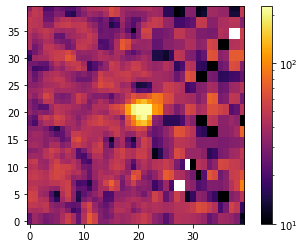

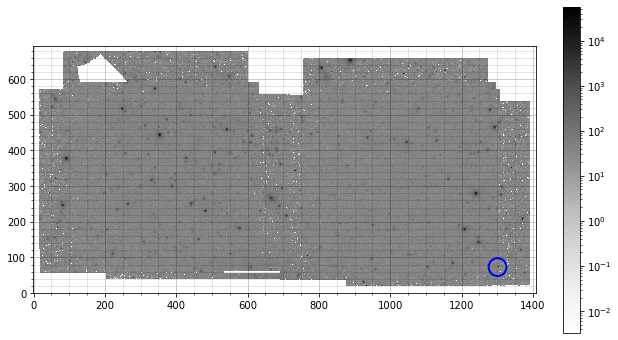

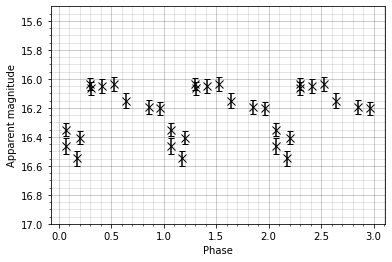

[16.34956173 16.40487417 16.03215941 16.04984067 16.03594522 16.15117526
 17.85804746 16.1916546  16.20449579 16.46227539 16.54858361 16.06396797]
[0.0714387  0.19943254 0.29589157 0.4105808  0.52274431 0.64413359
 0.73744593 0.85461005 0.96725288 0.06587265 0.17611971 0.30259069]


In [197]:
################ # note: 1,3 are only visible in channel 2
desired_star = 6
################

file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)
if desired_star >= 5:
    ra_temp = df_CC['RA'][desired_star]
    dec_temp = df_CC['dec'][desired_star]
    #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
    c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
else:
    c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])

print(c_CC)

if df_CC['type'][desired_star] == 'RR0':
    P = df_CC['period_fund'][desired_star]
    print('RRab')
elif df_CC['type'][desired_star] == 'RR1':
    P = df_CC['period_FO'][desired_star]
    print('RRc')
elif df_CC['type'][desired_star] == 'RR01':
    P = df_CC['period_FO'][desired_star]
temp = [i / P for i in LC_time]
phase = temp - np.floor(temp)

mags = []
errs = []

i = 1

for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    print(filename)
    with fits.open(filename) as hdu_list:
        data_ep = hdu_list[0].data
        hdr_ep = hdu_list[0].header
        exptime = hdr_ep['EXPTIME']
        fluxconv = hdr_ep['FLUXCONV']
        conv = exptime / fluxconv
        data_ep *= conv
    
    ep_file = 'phot_tables/PAL13/epochs/phot_table_'+method+'_'+channel+'_e'+str(i)+'.pickle'
    print(ep_file)
    pickle_in = open(ep_file, 'rb')
    ep_table = pickle.load(pickle_in)
    
    c_ep = SkyCoord(ep_table['RA'], ep_table['dec'], frame='icrs', unit='deg')
    
    star_id, d2d, d3d = c_CC.match_to_catalog_sky(c_ep)
    print('Star ID: ', star_id)
    for col in ep_table.colnames:
        ep_table[col].info.format = '%.8g'
    print(ep_table['x_fit', 'y_fit', 'RA', 'dec', 'flux_fit', 'apparent_mag'][star_id])
    
    mags.append(ep_table['apparent_mag'][star_id])
    errs.append(ep_table['mag_err'][star_id])
    
    star_r = 20
    star_x = int(ep_table['x_fit'][star_id])
    star_y = int(ep_table['y_fit'][star_id])
    star_ap = CircularAperture((star_x, star_y), r=25.)

    region = data_ep[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
    
    plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal', vmin=10, vmax=15**2)
    plt.colorbar()
    plt.show()
    #star_ap.plot(color='blue', lw=2.)
    
    plt.imshow(data_ep, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
    star_ap.plot(color='blue', lw=2.)
    plt.colorbar(fraction = 0.05)
    plt.minorticks_on()
    plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
    plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
    plt.gcf().set_size_inches(10, 6)
    plt.show()
    
    print('\n\n')
    
    i += 1

if desired_star == 2:
    naughty_list = [2, 8]   # these are EPOCH numbers of mismatches, not index
    for i in naughty_list:
        mags[i-1] = -99.

mags = np.ma.array(mags)
mags = np.ma.masked_values(mags, -99.)
errs = np.ma.masked_array(errs, mags.mask)
phase = np.ma.masked_array(phase, mags.mask)

mags_long = np.ma.concatenate((mags, mags, mags))
errs_long = np.ma.concatenate((errs, errs, errs))
phase_long = np.ma.concatenate((phase, phase+1., phase+2.))

plt.errorbar(phase_long, mags_long, yerr=errs_long, fmt='x', color='black', capsize=3, markersize=8)
#plt.ylim(np.nanmedian(mags) - 1.5*(max(mags)-min(mags)), np.nanmedian(mags) + 1.5*(max(mags)-min(mags)))
plt.ylim(15.5, 17)
plt.gca().invert_yaxis()
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.xlabel('Phase')
plt.ylabel('Apparent magnitude')
plt.show()

print(mags)
print(phase)

In [44]:
print(np.median(mags))



16.307462509264283
[16.427742193207383, -99, 16.304401810259336, 16.289296521209256, 16.27655535523028, 16.364965549920907, 16.572047126377683, -99, 16.27342815488046, 16.3586129926898, 16.310523208269235, 16.278422259043364]
[16.427742193207383 -- 16.304401810259336 16.289296521209256
 16.27655535523028 16.364965549920907 16.572047126377683 --
 16.27342815488046 16.3586129926898 16.310523208269235 16.278422259043364]


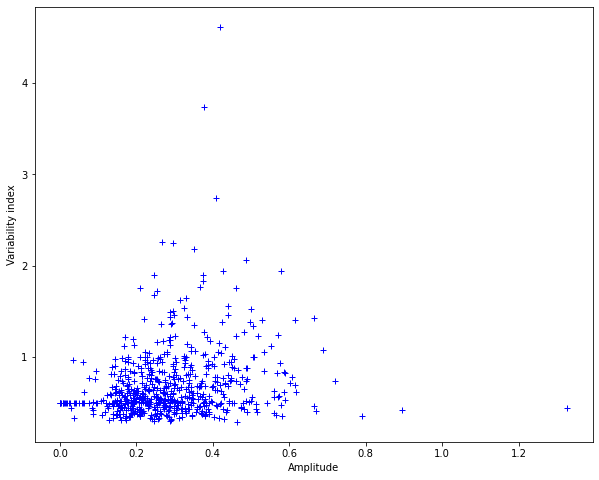

C:\Users\Jake\anaconda3\lib\site-packages\numpy\core\_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


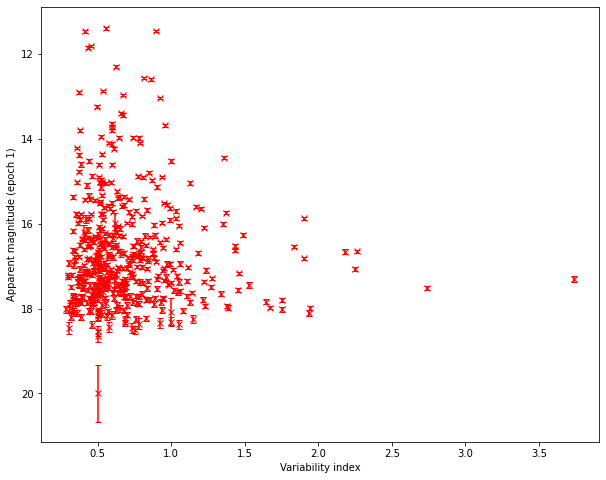

286


In [12]:
plt.plot(huge_table['amp'], huge_table['eta_inv'], 'b+')
plt.xlabel('Amplitude')
plt.ylabel('Variability index')
plt.gcf().set_size_inches(10, 8)
plt.show()

#plt.plot(huge_table['mag_e1'], huge_table['eta_inv'], 'b+')
plt.errorbar(huge_table['eta_inv'], huge_table['mag_e1'], yerr=huge_table['err_e1'], fmt='x', color='red', capsize=3, markersize=6)
plt.ylabel('Apparent magnitude (epoch 1)')
plt.xlabel('Variability index')
plt.gca().invert_yaxis()
plt.gcf().set_size_inches(10, 8)
plt.show()

print(huge_table['eta_inv'].argmax())

In [5]:
LC_time = []
for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        print(filename)
        hdr = hdu_list[0].header
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
    
print((LC_time))

data/PAL5\PAL5__e1\PAL5__e1_3p6um.fits
data/PAL5\PAL5__e2\PAL5__e2_3p6um.fits
data/PAL5\PAL5__e3\PAL5__e3_3p6um.fits
data/PAL5\PAL5__e4\PAL5__e4_3p6um.fits
data/PAL5\PAL5__e5\PAL5__e5_3p6um.fits
data/PAL5\PAL5__e6\PAL5__e6_3p6um.fits
data/PAL5\PAL5__e7\PAL5__e7_3p6um.fits
data/PAL5\PAL5__e8\PAL5__e8_3p6um.fits
data/PAL5\PAL5__e9\PAL5__e9_3p6um.fits
data/PAL5\PAL5__e10\PAL5__e10_3p6um.fits
data/PAL5\PAL5__e11\PAL5__e11_3p6um.fits
data/PAL5\PAL5__e12\PAL5__e12_3p6um.fits
[56422.909763090276, 56422.98037792824, 56423.03359486111, 56423.096869479166, 56423.158750648145, 56423.225721724535, 56423.277202604164, 56423.34184263889, 56423.403988252314, 56423.45839726852, 56423.51922112268, 56423.588995798615]


### GLOESS running:

[56524.37243767361, 56524.434811921295, 56524.496870393516, 56524.55862994213, 56524.62487443287, 56524.677250127315, 56524.73901320602, 56524.802780798615, 56524.86136105324, 56524.921150208334, 56524.98415725694, 56525.04442045139]
<SkyCoord (ICRS): (ra, dec) in deg
    (346.65533333, 12.82430556)>
RRab
Channel 1 ID:  555
[14.53963313178028, 14.51963399369297, 14.544863274126492, 14.531100738662882, 14.514565827679718, 14.550865977464616, 14.504542793396912, 14.44004881165462, 14.366859501470444, 99.0, 14.46001943314757, 14.528847749860129]
RRL5 ---- Period = 0.7 days
------------------------------------------------------
11 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 14.493    std dev = 0.050     amplitude = 0.140
Channels don't have the same number of measurements, so colour curve couldn't be plotted


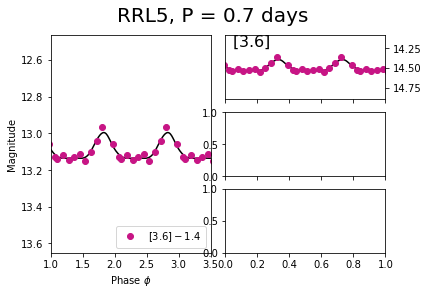

14.493496664713565 0.1400646962196479 nan nan


In [43]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
#pickle_in = open(load_name_ch2, 'rb')
#huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)


LC_time_gloess = []
for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        hdr = hdu_list[0].header
    LC_time_gloess.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
print(LC_time_gloess)




################ # note: 1,3 are only visible in channel 2
desired_star = 4
################
ch1_list = [0, 1, 2, 4]
ch2_list = [0, 1, 2, 3]

file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

if desired_star >= 5:
    ra_temp = df_CC['RA'][desired_star]
    dec_temp = df_CC['dec'][desired_star]
    #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
    c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
else:
    c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])
print(c_CC)

c_comp_ch1 = SkyCoord(huge_table_ch1['RA']*u.degree, huge_table_ch1['dec']*u.degree)
#c_comp_ch2 = SkyCoord(huge_table_ch2['RA']*u.degree, huge_table_ch2['dec']*u.degree)

if df_CC['type'][desired_star] == 'RR0':
    P = df_CC['period_fund'][desired_star]
    print('RRab')
elif df_CC['type'][desired_star] == 'RR1':
    P = df_CC['period_FO'][desired_star]
    print('RRc')
elif df_CC['type'][desired_star] == 'RR01':
    P = df_CC['period_fund'][desired_star]
    print('RRd')
else:  # if not marked by christine as an RRL, we'll just take the fundamental period
    P = df_CC['period_fund'][desired_star]
    print('RRab')

#P = 0.7

temp = [i / P for i in LC_time_gloess]
phase = temp - np.floor(temp)

star_id_ch1, d2d_ch1, d3d_ch1 = c_CC.match_to_catalog_sky(c_comp_ch1)
#star_id_ch2, d2d_ch2, d3d_ch2 = c_CC.match_to_catalog_sky(c_comp_ch2)

if desired_star in ch1_list:
    print('Channel 1 ID: ', star_id_ch1)
#if desired_star in ch2_list:
#    print('Channel 2 ID: ', star_id_ch2)


#star_id_ch1 = 632
#star_id_ch2 = 658
#star_id_ch1 = 37
#star_id_ch2 = 60

huge_table_ch1_f = copy.copy(huge_table_ch1.filled(99))
#huge_table_ch2_f = copy.copy(huge_table_ch2.filled(99))

mags_ch1 = []
mags_ch2 = []
errs_ch1 = []
errs_ch2 = []
for j in range(1,13):
    if desired_star in ch1_list:
        mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][star_id_ch1])
        errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][star_id_ch1])
    #if desired_star in ch2_list:
    #    mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][star_id_ch2])
    #    errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][star_id_ch2])
        

### Masking out a specific data point (only use in emergencies, or the Science Police will get you):
# EPOCH number of bad point:
#remove_pls = 5
#mags_ch2[remove_pls-1] = 99
#print(mags_ch1)

###
        
# Since GLOESS already discards bunk magnitudes, I need to leave them in as 99
'''mags_ch1 = np.ma.array(mags_ch1)
mags_ch1 = np.ma.masked_where(mags_ch1 == 99, mags_ch1)
mags_ch2 = np.ma.array(mags_ch2)
mags_ch2 = np.ma.masked_where(mags_ch2 == 99, mags_ch2)
errs_ch1 = np.ma.array(errs_ch1)
errs_ch1 = np.ma.masked_where(errs_ch1 == 99, errs_ch1)
errs_ch2 = np.ma.array(errs_ch2)
errs_ch2 = np.ma.masked_where(errs_ch2 == 99, errs_ch2)'''  

print(mags_ch1)
#print(mags_ch2)

ch1_smooth = 0.25
ch2_smooth = 0.25

#mean_ch1, amp_ch1, mean_ch2, amp_ch2 = runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(desired_star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = jg.runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(desired_star+1), ch1_smooth, ch2_smooth, wantcolour='yes')

print(mean_ch1, amp_ch1, mean_ch2, amp_ch2)

RRL3: (outlier is epoch 5)
removed outlier, smoothing 0.15: 16.547042132282613
removed outlier, smoothing 0.25: 16.547042132282613
kept outlier, smoothing 0.15:    16.53625595628294
kept outlier, smoothing 0.25:    16.536216852964355

#### Running GLOESS over all known RRL in sample:

In [66]:
#pd.reset_option('^display.', silent=True)

df_CC

,ID,RA,dec,units,period_fund,period_FO,mean_mag_CC,amplitude,colour,type,gaia_ID,gaia_ID_1,gaia_ID_2
0,1,15h15m57.18s,-00d06m53.3s,R0,NaN,0.293229,17.7100,0.42,B,RR1,4.418915e+18,4.418915e+09,8.423459e+08
1,2,15h15m57.95s,-00d11m23.4s,R0,0.456049,0.332460,17.8100,0.40,B,RR01,4.418913e+18,4.418913e+09,8.706888e+08
2,3,15h16m12.76s,-00d10m03.3s,R0,NaN,0.329946,17.7000,0.50,B,RR1,4.418726e+18,4.418726e+09,1.612506e+07
3,4,15h16m05.79s,-00d11m12.7s,R0,NaN,0.286400,17.6900,0.48,B,RR1,NaN,NaN,NaN
4,5,15h15m58.23s,-00d05m47.4s,R0,NaN,0.337933,17.7000,0.30,B,RR1,4.418921e+18,4.418921e+08,8.077111e+09
5,6,228.99635,-0.08978,R0,0.643228,NaN,17.2908,NaN,NaN,RR0,4.418921e+18,4.418921e+09,7.326200e+08


In [92]:
file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

for star in range(len(df_CC)):
    print(df_CC['gaia_ID'][star])
    
df_CC['period_fund'].isnull()

4418914863842345856
4418913218870688768
4418726027016125056
0
4418920808077110784
4418920846732620032


0     True
1    False
2     True
3     True
4     True
5    False
Name: period_fund, dtype: bool

Gaia DR2 ID: 2814894112367752192
RRab
Channel 1 ID:  561
Channel 1 mags:  [16.33076283093409, 16.207756560274152, 16.19861909023209, 16.2679385119346, 16.25594548007045, 16.339967555343666, 16.45295911464851, 16.531741330561424, 16.52561882562927, 16.448570080485883, 16.43484535955322, 16.4792095999772] 

RRL1 ---- Period = 0.5382 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.379    std dev = 0.083     amplitude = 0.249
Channels don't have the same number of measurements, so colour curve couldn't be plotted


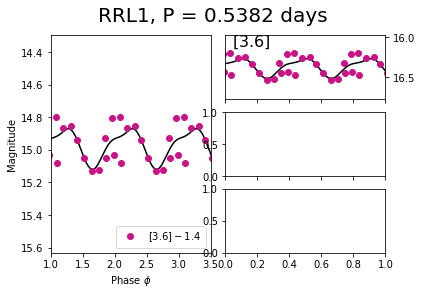




Gaia DR2 ID: 2814893910504602624
RRab
Channel 1 ID:  475
Channel 1 mags:  [16.2543251375728, 16.29769575451573, 16.149298238892484, 16.137335693204484, 16.07927811574676, 16.096297709040606, 16.151367239203143, 16.193821190907034, 16.240172172952697, 16.256677471364835, 16.32222495205589, 16.339237081574836] 

RRL2 ---- Period = 0.5971 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.193    std dev = 0.071     amplitude = 0.207
Channels don't have the same number of measurements, so colour curve couldn't be plotted


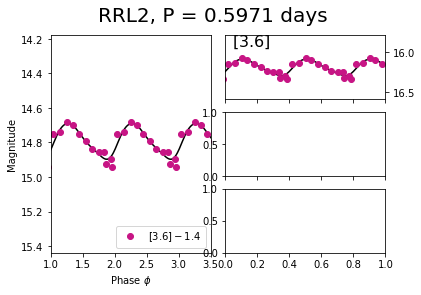




Gaia DR2 ID: 2814893910504601600
RRab
Channel 1 ID:  499
Channel 1 mags:  [16.266617080928928, 16.40336531909664, 16.255619451946878, 16.213577055985635, 16.172122852508906, 16.13067575020504, 16.20276924574487, 16.248375444946753, 16.285974340725183, 16.43195094119917, 16.592646504406478, 16.5239653644862] 

RRL3 ---- Period = 0.5782 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.281    std dev = 0.100     amplitude = 0.295
Channels don't have the same number of measurements, so colour curve couldn't be plotted


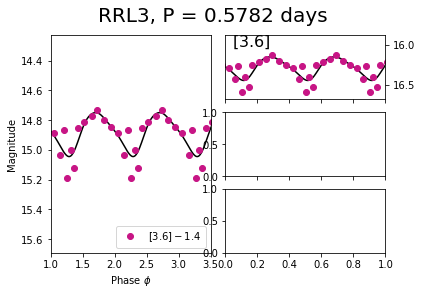

,ID,RA,dec,units,period_fund,period_FO,mean_mag_CC,amplitude,colour,type,gaia_ID,gaia_ID_1,gaia_ID_2,comments,mean_mag_ch1,mean_std_ch1,mean_photerr_ch1,period_used,period_PL,A_ch1
0,1,23h06m41.53s,12d46m58.9s,R0,0.5382,NaN,17.886,0.80,V,RR0,2814894112367752192,2814894112,367752192,NaN,16.359301,0.082745,0.037728,0.5382,0.5382,0.02
1,2,23h06m44.47s,12d46m16.1s,R0,0.5971,NaN,17.819,0.79,V,RR0,2814893910504602624,2814893910,504602624,only 90% sure on this gaia id,16.173061,0.071170,0.033696,0.5971,0.5971,0.02
2,3,23h06m43.14s,12d46m47.8s,R0,0.5782,NaN,17.766,0.83,V,RR0,2814893910504601600,2814893910,504601600,NaN,16.261237,0.100364,0.033847,0.5782,0.5782,0.02
3,4,23h06m48.83s,12d41m22.3s,R0,0.5751,NaN,17.886,0.52,V,RR0,2811888666052959232,2811888666,52959232,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,23h06m37.28s,12d49m27.5s,R0,7.2600,NaN,17.029,0.40,V,SR?,2814897312118708992,2814897312,118708992,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/PAL13/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/PAL13/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
#pickle_in = open(load_name_ch2, 'rb')
#huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)


LC_time_gloess = []
for filename in glob.glob(base_dir+'*/PAL13__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/PAL13__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        hdr = hdu_list[0].header
    LC_time_gloess.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)


ch1_smooth = 0.25
ch2_smooth = 0.25

means_ch1 = []
means_ch2 = []
stds_ch1 = []
stds_ch2 = []
photerr_mean_ch1 = []
photerr_mean_ch2 = []
amps_ch1 = []
amps_ch2 = []
periods = []
periods_PL = []
A_ch1 = []
A_ch2 = []

file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

ch1_list = [0, 1, 2, 4]
ch2_list = [0, 1, 2, 3]

for star in range(len(df_CC)):

    ################ # note: 1,3 are only visible in channel 2
    #desired_star = 3
    ################
    
    if star == 3 or star == 4:  # star 3 isn't in channel 1, and star 4 probably isn't an RRL, so we skip
        means_ch1.append(float('NaN'))
        means_ch2.append(float('NaN'))
        stds_ch1.append(float('NaN'))
        stds_ch2.append(float('NaN'))
        photerr_mean_ch1.append(float('NaN'))
        photerr_mean_ch2.append(float('NaN'))
        periods.append(float('NaN'))
        periods_PL.append(float('NaN'))
        A_ch1.append(float('NaN'))
        A_ch2.append(float('NaN'))
        continue
    
    if df_CC['gaia_ID'][star] != 0:
        #print('Gaia DR2 ID: {:.0f}'.format(df_CC['gaia_ID'][star]))
        id1 = df_CC['gaia_ID_1'][star]
        id2 = df_CC['gaia_ID_2'][star]
        gaia_id = int(str(int(id1)) + str(int(id2)))  # this method is so fucked but it's the only way to avoid float precision errors :)))))
        print('Gaia DR2 ID:', gaia_id)

    if star >= 5:
        ra_temp = df_CC['RA'][star]
        dec_temp = df_CC['dec'][star]
        #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
        c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
    else:
        c_CC = SkyCoord(df_CC['RA'][star], df_CC['dec'][star], frame='icrs', unit='deg')
    #print(c_CC)

    c_comp_ch1 = SkyCoord(huge_table_ch1['RA']*u.degree, huge_table_ch1['dec']*u.degree)
    #c_comp_ch2 = SkyCoord(huge_table_ch2['RA']*u.degree, huge_table_ch2['dec']*u.degree)

    if df_CC['type'][star] == 'RR0':
        P = df_CC['period_fund'][star]
        P_PL = P
        print('RRab')
    elif df_CC['type'][star] == 'RR1':
        P = df_CC['period_FO'][star]
        P_PL = P * 10**0.127
        print(P, P_PL)
        print('RRc')
    elif df_CC['type'][star] == 'RR01':
        P = df_CC['period_FO'][star]
        P_PL = P * 10**0.127
        print('RRd')
    #elif star == 4:
    #    P = 0.7
    #    P_PL = P
    #    print('SR? (weird star 5)')
    else:  # if not marked by christine as an RRL, we'll just take the fundamental period
        P = df_CC['period_fund'][star]
        P_PL = P
        print('RRab')
    
    periods.append(P)
    periods_PL.append(P_PL)
    temp = [i / P for i in LC_time_gloess]
    phase = temp - np.floor(temp)

    star_id_ch1, d2d_ch1, d3d_ch1 = c_CC.match_to_catalog_sky(c_comp_ch1)
    #star_id_ch2, d2d_ch2, d3d_ch2 = c_CC.match_to_catalog_sky(c_comp_ch2)

    if star in ch1_list:
        print('Channel 1 ID: ', star_id_ch1)
    #if star in ch2_list:
    #    print('Channel 2 ID: ', star_id_ch2)

    huge_table_ch1_f = copy.copy(huge_table_ch1.filled(99))
    #huge_table_ch2_f = copy.copy(huge_table_ch2.filled(99))

    mags_ch1 = []
    mags_ch2 = []
    errs_ch1 = []
    errs_ch2 = []
    for j in range(1,13):
        if star in ch1_list:
            mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][star_id_ch1])
            errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][star_id_ch1])
        #if star in ch2_list:
        #    mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][star_id_ch2])
        #    errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][star_id_ch2])


    ### Masking out a specific data point (only use in emergencies, or the Science Police will get you):
    # EPOCH number of bad point:
    #remove_pls = 5
    #mags_ch2[remove_pls-1] = 99
    #print(mags_ch1)

    ###

    # Since GLOESS already discards bunk magnitudes, I need to leave them in as 99

    print('Channel 1 mags: ', mags_ch1, '\n')
    #print('Channel 2 mags: ', mags_ch2, '\n')
    
    ###   EXTINCTION   ###
    
    ex_table = IrsaDust.get_extinction_table(c_CC)
    ex_table.add_index('Filter_name')
    idx_ch1 = ex_table.loc_indices[['IRAC-1']]
    idx_ch2 = ex_table.loc_indices[['IRAC-2']]
    ext_ch1 = ex_table['A_SandF'][idx_ch1]
    ext_ch2 = ex_table['A_SandF'][idx_ch2]
    A_ch1.append(ext_ch1)
    #A_ch2.append(ext_ch2)

    #mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
    mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = jg.runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
    
    # Correcting for extinction:
    mean_ch1 -= ext_ch1
    #mean_ch2 -= ext_ch2
    
    means_ch1.append(mean_ch1)
    #means_ch2.append(mean_ch2)
    stds_ch1.append(std_ch1)
    #stds_ch2.append(std_ch2)
    amps_ch1.append(amp_ch1)
    #amps_ch2.append(amp_ch2)
    
    ###   ERROR IN MEAN MAGNITUDE   ###
    
    '''if star in ch1_list:
        ch1_temp = [(1. / e**2) for e in errs_ch1]
        err_ch1 = np.sqrt(1. / sum(ch1_temp))
        err_mean_ch1.append(err_ch1)
    if star in ch2_list:
        ch2_temp = [(1. / e**2) for e in errs_ch2]
        err_ch2 = np.sqrt(1. / sum(ch2_temp))
        err_mean_ch2.append(err_ch2)'''
    
    '''ch1_temp = [(1. / e**2) for e in errs_ch1]
    #ch2_temp = [(1. / e**2) for e in errs_ch2]
    
    if ch1_temp:
        photerr_ch1 = np.sqrt(1. / sum(ch1_temp))
    else:
        photerr_ch1 = float('NaN')
    #if ch2_temp:
    #    photerr_ch2 = np.sqrt(1. / sum(ch2_temp))
    #else:
    #    photerr_ch2 = float('NaN')'''
    
    errs_ch1 = np.ma.masked_equal(errs_ch1, 99)
    errs_ch2 = np.ma.masked_equal(errs_ch2, 99)
    
    if len(errs_ch1) != 0:
        photerr_ch1 = sum(errs_ch1.compressed()) / len(errs_ch1.compressed())
    else:
        photerr_ch1 = float('NaN')
    if len(errs_ch2) != 0:
        photerr_ch2 = sum(errs_ch2.compressed()) / len(errs_ch2.compressed())
    else:
        photerr_ch2 = float('NaN')
    
    photerr_mean_ch1.append(photerr_ch1)
    #photerr_mean_ch2.append(photerr_ch2)
    
    print('\n\n')
    
df_CC['mean_mag_ch1'] = means_ch1
#df_CC['mean_mag_ch2'] = means_ch2
df_CC['mean_std_ch1'] = stds_ch1
#df_CC['mean_std_ch2'] = stds_ch2
df_CC['mean_photerr_ch1'] = photerr_mean_ch1
#df_CC['mean_photerr_ch2'] = photerr_mean_ch2
df_CC['period_used'] = periods
df_CC['period_PL'] = periods_PL
df_CC['A_ch1'] = A_ch1
#df_CC['A_ch2'] = A_ch2

df_CC

In [43]:
extra = 0.1
ar = [45.2, 164.65, 46.65]
are = [45.2+extra, 164.65+extra, 46.65+extra]
print(np.mean(ar))
print(np.mean(are))

85.5
85.60000000000001


### Plotting PL relation:

In [27]:
print(np.sqrt(err_int_ch1**2 + aerr_ch1**2))
print(np.sqrt(aerr_ch1**2 + berr_ch1**2 + disp_ch1**2))

0.03000669339000035
0.43520110293977887


In [20]:
print(np.log10(periods_ch1.compressed()) + 0.3, PL_fit_ch1(periods_ch1.compressed(), intercept_ch1))
print(np.log10(periods_ch2.compressed()) + 0.3, PL_fit_ch1(periods_ch2.compressed(), intercept_ch2))

print(sorted(np.log10(periods_ch1.compressed()) + 0.3))

[-0.10579364 -0.054557   -0.04416952  0.10836629] [16.46749684 16.32505897 16.29618179 15.87213222]
[-0.10579364 -0.05126073 -0.054557   -0.11602699 -0.04416952  0.10836629] [16.52823133 16.37662983 16.38579346 16.55668002 16.35691628 15.93286671]
[-0.10579364350746645, -0.05455700068112679, -0.04416952473027552, 0.10836629154049193]


[0.03772790353896322 0.033695914660843374 0.03384708337447779 -- --]
[0.0827446391669147 0.07116998771700185 0.10036370666105167 -- --]
[0.09093992531505746 0.07874377319171995 0.10591741437414566 -- --]


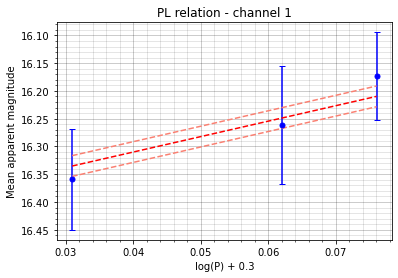

Intercept, a: 16.421204
Error in a:    0.018664


Distance: 23.13 ± 0.38 (random) ± 1.26 (systematic) kpc


"popt, pcov = curve_fit(PL_fit_ch2, periods_ch2.compressed(), means_ch2.compressed())\nintercept_ch2 = popt[0]\nerr_int_ch2 = np.sqrt(pcov[0][0])\n\nplt.errorbar(np.log10(periods_ch2.compressed()) + 0.3, means_ch2.compressed(), yerr=err_mean_ch2.compressed(), fmt='o', color='blue', capsize=3, markersize=5)\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2), 'r--')\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 + err_int_ch2), c='salmon', ls='--')\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 - err_int_ch2), c='salmon', ls='--')\nplt.minorticks_on()\nplt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')\nplt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')\nplt.gca().invert_yaxis()\nplt.xlabel('log(P) + 0.3')\nplt.ylabel('Mean apparent magnitude')\nplt.tit

In [48]:
a_ch1 = -0.40  # Neeley 2019 intercept for absolute mag, M
a_ch2 = -0.41
b_ch1 = -2.78
b_ch2 = -2.83

aerr_ch1 = 0.03
aerr_ch2 = 0.03
berr_ch1 = 0.38
berr_ch2 = 0.39
disp_ch1 = 0.21
disp_ch2 = 0.21

def PL_fit_ch1(P, a):  # note this a is DIFFERENT to a_ch1 above; this a is the variable being fit
    return a + b_ch1 * (np.log10(P) + 0.3)
def PL_fit_ch2(P, a):
    return a + b_ch2 * (np.log10(P) + 0.3)

means_ch1 = np.ma.masked_invalid(means_ch1)
#means_ch2 = np.ma.masked_invalid(means_ch2)
photerr_mean_ch1 = np.ma.masked_array(photerr_mean_ch1, means_ch1.mask)
#photerr_mean_ch2 = np.ma.masked_array(photerr_mean_ch2, means_ch2.mask)
stds_ch1 = np.ma.masked_array(stds_ch1, means_ch1.mask)
#stds_ch2 = np.ma.masked_array(stds_ch2, means_ch2.mask)
periods_ch1 = np.ma.masked_array(df_CC['period_PL'], means_ch1.mask)
#periods_ch2 = np.ma.masked_array(df_CC['period_PL'], means_ch2.mask)

err_mean_ch1 = np.sqrt(photerr_mean_ch1**2 + stds_ch1**2)
#err_mean_ch2 = np.sqrt(photerr_mean_ch2**2 + stds_ch2**2)

print(photerr_mean_ch1)
print(stds_ch1)
print(err_mean_ch1)

#########

popt, pcov = curve_fit(PL_fit_ch1, periods_ch1.compressed(), means_ch1.compressed())
intercept_ch1 = popt[0]
err_int_ch1 = np.sqrt(pcov[0][0])

plt.errorbar(np.log10(periods_ch1.compressed()) + 0.3, means_ch1.compressed(), yerr=err_mean_ch1.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1), 'r--')
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1 + err_int_ch1), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1 - err_int_ch1), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 1')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\n\n'.format(intercept_ch1, err_int_ch1))

dist_mod_ch1 = intercept_ch1 - a_ch1
dist_ch1 = 10 ** ((dist_mod_ch1 / 5.) + 1.)

#dist_randerr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * np.sqrt(err_int_ch1**2 + aerr_ch1**2))
dist_randerr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * np.sqrt(err_int_ch1**2 + aerr_ch1**2))

#dist_syserr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * np.sqrt(aerr_ch1**2 + berr_ch1**2 + disp_ch1**2))
#dist_syserr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * np.sqrt(berr_ch1**2))
dist_syserr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * np.sqrt(aerr_ch1**2 + (0.3**2 * berr_ch1**2)))  # 0.3^2 from PL equation

print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc'.format(dist_ch1/1000, dist_randerr_ch1/1000, dist_syserr_ch1/1000))


#########

'''popt, pcov = curve_fit(PL_fit_ch2, periods_ch2.compressed(), means_ch2.compressed())
intercept_ch2 = popt[0]
err_int_ch2 = np.sqrt(pcov[0][0])

plt.errorbar(np.log10(periods_ch2.compressed()) + 0.3, means_ch2.compressed(), yerr=err_mean_ch2.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2), 'r--')
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 + err_int_ch2), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 - err_int_ch2), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 2')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\n\n'.format(intercept_ch2, err_int_ch2))

dist_mod_ch2 = intercept_ch2 - a_ch2
dist_ch2 = 10 ** ((dist_mod_ch2 / 5.) + 1.)
dist_randerr_ch2 = abs(dist_ch2) * abs(0.2 * np.log(10.) * np.sqrt(err_int_ch2**2 + aerr_ch2**2))
dist_syserr_ch2 = abs(dist_ch2) * abs(0.2 * np.log(10.) * np.sqrt(aerr_ch2**2 + (0.3**2 * berr_ch2**2)))  # 0.3^2 from PL equation
print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc'.format(dist_ch2/1000, dist_randerr_ch2/1000, dist_syserr_ch2/1000))


#########

# Plotting only channel 2 stars also visible in channel 1:
means_ch2_1 = np.ma.masked_array(means_ch2, means_ch1.mask)
photerr_mean_ch2_1 = np.ma.masked_array(photerr_mean_ch2, means_ch1.mask)
stds_ch2_1 = np.ma.masked_array(stds_ch2, means_ch1.mask)
err_mean_ch2_1 = np.ma.masked_array(err_mean_ch2, means_ch1.mask)
periods_ch2_1 = np.ma.masked_array(periods_ch2, means_ch1.mask)

popt, pcov = curve_fit(PL_fit_ch2, periods_ch2_1.compressed(), means_ch2_1.compressed())
intercept_ch2_1 = popt[0]
err_int_ch2_1 = np.sqrt(pcov[0][0])

plt.errorbar(np.log10(periods_ch2_1.compressed()) + 0.3, means_ch2_1.compressed(), yerr=err_mean_ch2_1.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1), 'r--')
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1 + err_int_ch2_1), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1 - err_int_ch2_1), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 2 (same stars as in channel 1)')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\n\n'.format(intercept_ch2_1, err_int_ch2_1))

dist_mod_ch2_1 = intercept_ch2_1 - a_ch2
dist_ch2_1 = 10 ** ((dist_mod_ch2_1 / 5.) + 1.)
dist_randerr_ch2_1 = abs(dist_ch2_1) * abs(0.2 * np.log(10.) * np.sqrt(err_int_ch2_1**2 + aerr_ch2**2))
dist_syserr_ch2_1 = abs(dist_ch2_1) * abs(0.2 * np.log(10.) * np.sqrt(aerr_ch2**2 + (0.3**2 * berr_ch2**2)))  # 0.3^2 from PL equation
print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc'.format(dist_ch2_1/1000, dist_randerr_ch2_1/1000, dist_syserr_ch2_1/1000))'''


In [151]:
gaia_path = 'data/reference/PAL13_Gaia_radius_11_arcmin.csv'
gaiatbl = Table.read(gaia_path, format='ascii.csv')
gaiatbl

source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,phot_g_mean_mag,bp_rp,radial_velocity,radial_velocity_error,phot_variable_flag,teff_val,a_g_val
str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str13,float64,float64
4418726022720714496,229.05130126590058,0.5946640498745677,-0.16757515258163974,0.7148872140027759,0.40257479377835004,1.1479129827850583,20.238188,0.47784424,--,--,NOT_AVAILABLE,--,--
4418731902531386752,229.05851033194403,0.06757876631879857,-0.15926963235012365,0.07797046845270987,0.001158776857898297,0.0888395925387604,16.549107,1.2151327,--,--,NOT_AVAILABLE,4846.0,--
4418734135913614720,229.15854401914493,1.1576371207046214,-0.07166359195888196,1.0932049081643402,1.6383165231784167,1.54098934273537,20.77711,0.67520905,--,--,NOT_AVAILABLE,--,--
4418724236015579136,229.03362768717028,2.2055961653957112,-0.2565037583499093,3.283769537545818,--,--,20.908073,0.6326771,--,--,NOT_AVAILABLE,--,--
4418731898235975680,229.0657161497752,3.1136191924486947,-0.15614111967828637,2.5541690074611934,--,--,21.110931,--,--,--,NOT_AVAILABLE,--,--
4418732791590954752,229.20377600749882,0.36012085236783603,-0.13063816242032247,0.3199413153745435,-0.024922524132329017,0.4224190577357959,19.358404,0.7462406,--,--,NOT_AVAILABLE,--,--
4418732177408528512,229.1267323956023,0.9988953847194617,-0.14216530463623892,1.118050730383731,--,--,20.683395,-0.013763428,--,--,NOT_AVAILABLE,--,--
4418723583179057792,228.9641159003432,0.8816335866903942,-0.2587831713893927,0.6961945153544051,0.5970942540415978,0.9352060431117692,20.558796,0.9180794,--,--,NOT_AVAILABLE,--,--
4418730699939778560,229.16296018798593,0.8590626144412626,-0.19222964050914673,1.1482678555175754,--,--,20.516901,1.5482826,--,--,NOT_AVAILABLE,--,--


In [49]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)

maxRA = max(max(huge_table_ch1['RA']), max(huge_table_ch2['RA']))
minRA = min(min(huge_table_ch1['RA']), min(huge_table_ch2['RA']))
maxdec = max(max(huge_table_ch1['dec']), max(huge_table_ch2['dec']))
mindec = min(min(huge_table_ch1['dec']), min(huge_table_ch2['dec']))

cmax = SkyCoord(maxRA, maxdec, frame='icrs', unit='deg')
cmin = SkyCoord(minRA, mindec, frame='icrs', unit='deg')

print(cmax.ra.hour)
print(cmin.ra.hour)
print(cmax.dec.deg)
print(cmin.dec.deg)
print('')
print(cmax.ra.hms)
print(cmin.ra.hms)
print(cmax.dec.dms)
print(cmin.dec.dms)
print('')
print('Max RA: ',cmax.ra.deg)
print('Min RA: ',cmin.ra.deg)
print('Max dec:',cmax.dec.deg)
print('Min dec:',cmin.dec.deg)

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_PSF_4p5um_model_emaster.pickle'

i:  0
Gaia ID:  4418920808077110784
Other ID: V5 (K62)
Period:   0.337934
        ra                 dec         
------------------ --------------------
228.99266625761803 -0.09659804838365565
Star match:  640
   RA        dec     
-------- ------------
228.9927 -0.096493326


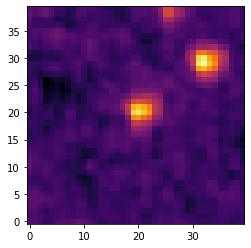

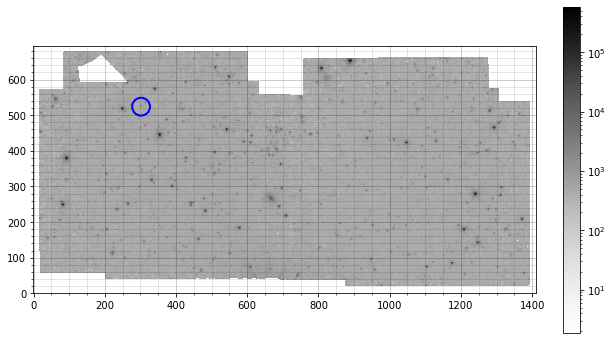



i:  1
Gaia ID:  4418920846732620032
Other ID: --
Period:   0.643239
        ra                 dec         
------------------ --------------------
228.99634825110095 -0.08977613143985393
Star match:  615
    RA        dec     
--------- ------------
228.99637 -0.089710531


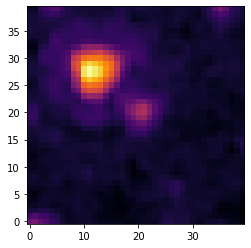

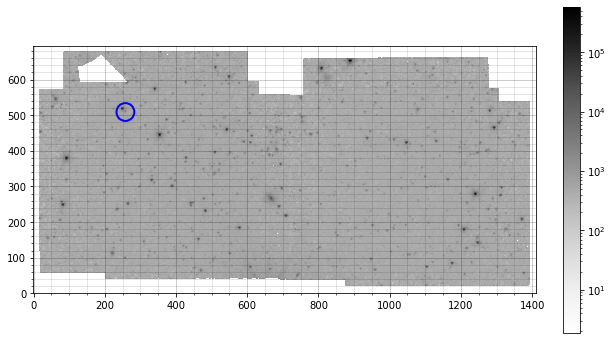



i:  2
Gaia ID:  4418914863842345856
Other ID: V1 (K62)
Period:   0.293229
        ra                 dec         
------------------ --------------------
228.98840114088054 -0.11479928258025933
Star match:  658
    RA        dec    
--------- -----------
228.98847 -0.11472219


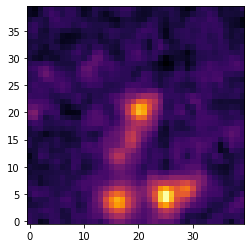

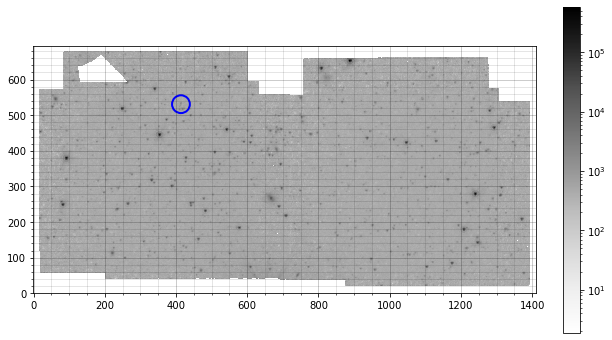



i:  3
Gaia ID:  4418726027016125056
Other ID: V3 (K62)
Period:   0.329948
        ra                 dec         
------------------ --------------------
229.05318546815684 -0.16753341271842292
Star match:  60
    RA        dec    
--------- -----------
229.05323 -0.16744948


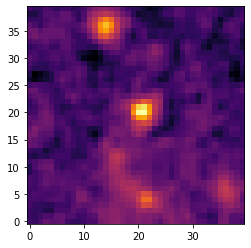

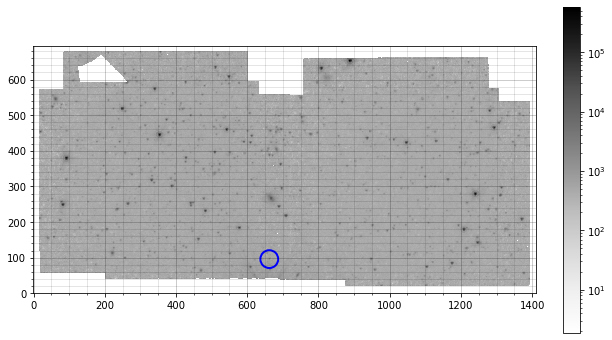



i:  4
Gaia ID:  4418725889577171328
Other ID: V4 (K62)
Period:   0.286366
        ra                 dec        
------------------ -------------------
229.02409317322295 -0.1868582773571904
Star match:  255
    RA        dec    
--------- -----------
229.02412 -0.18677468


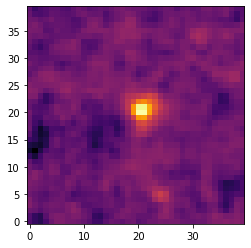

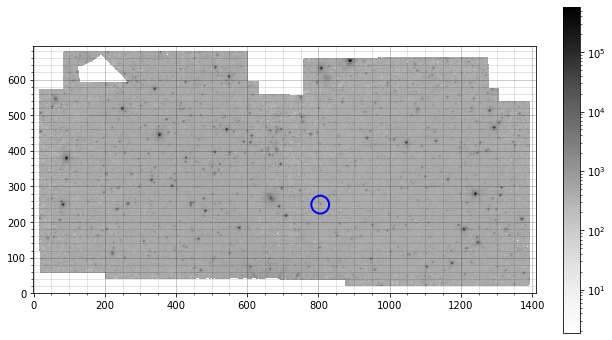



i:  5
Gaia ID:  4418731829516302848
Other ID: --
Period:   0.28164
        ra                 dec        
------------------ -------------------
229.09705423020364 -0.1419234982327973
Star out of our range


i:  6
Gaia ID:  4418913218870688768
Other ID: V2 (K62)
Period:   0.332473
        ra                 dec         
------------------ --------------------
228.99144962264384 -0.18985356481473498
Star match:  506
    RA       dec    
--------- ----------
228.99149 -0.1897417


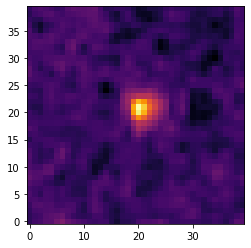

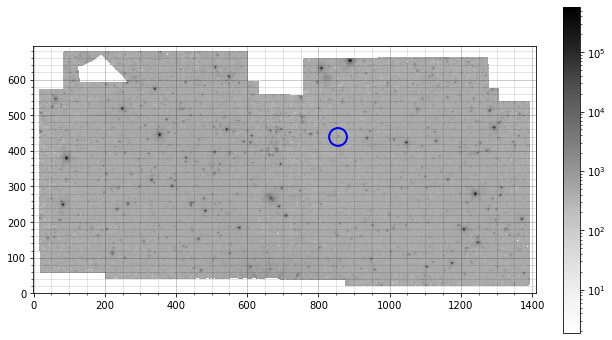



i:  7
Gaia ID:  4418734165978521728
Other ID: --
Period:   0.380859
        ra                 dec         
------------------ --------------------
229.14462533811073 -0.07361857966701019
Star out of our range


i:  8
Gaia ID:  4418724034151291776
Other ID: 403 (V04)
Period:   0.551705
        ra                dec         
----------------- --------------------
229.0395752980474 -0.27315259808741965
Star match:  42
    RA        dec    
--------- -----------
229.03964 -0.27308442


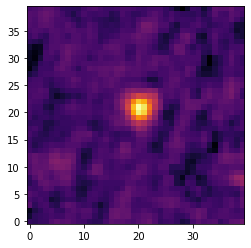

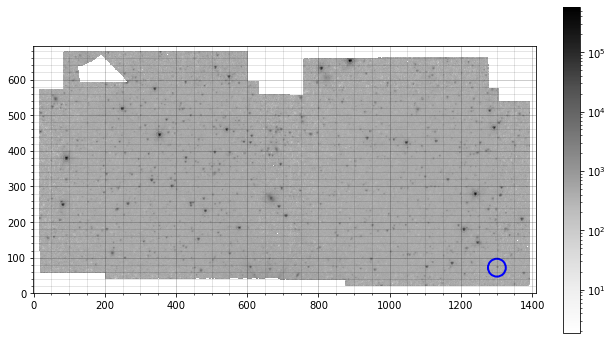



i:  9
Gaia ID:  4418732791593809152
Other ID: 405 (V04)
Period:   0.32967
Star not found in Gaia table




In [185]:
pw_path = 'data/reference/price_whelan_data/RRLwithprobthin.fits'
hdultemp = fits.open(pw_path)
data0 = hdultemp[0].header
data1 = hdultemp[1].data
#data1.shape
tbl = Table.read(pw_path)
#tbl.show_in_notebook()
#print('{:.0f}'.format(tbl['source_id'][0]))
tbl.add_index('designation')
idxyay = tbl.loc['Gaia DR2 4418914863842345856']
#idxyay
#tbl.loc[4418914863842345856]

pwtbl_path = 'data/reference/price_whelan_data/pw-table2.txt'
pwtbl = Table.read(pwtbl_path, format='ascii.csv')
#pwtbl

gaia_path = 'data/reference/PAL13_Gaia_radius_11_arcmin.csv'
gaiatbl = Table.read(gaia_path, format='ascii.csv')
gaiatbl.add_index('source_id')

c_comp = SkyCoord(huge_table['RA'], huge_table['dec'], frame='icrs', unit='deg')

for i in range(len(pwtbl)):
    print('i: ', i)
    
    hereiam = pwtbl['source_id'][i]
    print('Gaia ID: ', hereiam)
    print('Other ID:', pwtbl['other_id'][i])
    print('Period:  ', pwtbl['period'][i])
    try:
        hola = gaiatbl.loc[hereiam]
        print(hola['ra', 'dec'])
     
        ra_temp = hola['ra']
        dec_temp = hola['dec']

        if ra_temp >= cmin.ra.deg and ra_temp <= cmax.ra.deg and dec_temp >= cmin.dec.deg and dec_temp <= cmax.dec.deg:
            c_temp = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')

            star_match, d2d, d3d = c_temp.match_to_catalog_sky(c_comp)
            print('Star match: ', star_match)

            print(huge_table['RA', 'dec'][star_match])

            star_r = 20
            star_x = int(huge_table['x_0'][star_match])
            star_y = int(huge_table['y_0'][star_match])
            star_ap = CircularAperture((star_x, star_y), r=25.)

            region = data_m[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
            plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal')
            #star_ap.plot(color='white')
            plt.show()

            plt.imshow(data_m, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
            star_ap.plot(color='blue', lw=2.)
            plt.colorbar(fraction = 0.05)
            plt.minorticks_on()
            plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
            plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
            plt.gcf().set_size_inches(10, 6)
            plt.show()
        else:
            print('Star out of our range')
        
    except KeyError:
        hola = 'Star not found in Gaia table'
        print(hola)
        
    
    #hello = tbl.loc['Gaia DR2 '+hereiam]
    #print(hello['designation'])
    
    print('\n')

In [139]:
pwtbl_path = 'data/reference/price_whelan_data/pw-table2.txt'
pwtbl = Table.read(pwtbl_path, format='ascii.csv')
pwtbl

source_id,other_id,period,amp-g,type,D,member_prob,separation
str19,str9,float64,float64,str4,float64,float64,float64
4418920808077110784,V5 (K62),0.337934,0.46,RRc,20.7,1.0,2.0
4418920846732620032,--,0.643239,0.27,RRab,21.7,0.99,2.0
4418914863842345856,V1 (K62),0.293229,0.56,RRc,20.4,0.95,2.0
4418726027016125056,V3 (K62),0.329948,0.51,RRc,20.7,1.0,3.9
4418725889577171328,V4 (K62),0.286366,0.59,RRc,20.3,1.0,4.5
4418731829516302848,--,0.28164,0.3,RRc,18.1,0.65,4.9
4418913218870688768,V2 (K62),0.332473,0.4,RRc,20.3,1.0,5.1
4418734165978521728,--,0.380859,0.52,RRc,22.8,0.91,7.7
4418724034151291776,403 (V04),0.551705,1.14,RRab,21.2,1.0,9.8


In [23]:
file_CC = 'data/reference/CVSGC_PAL13_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

C = SkyCoord(df_CC.RA[0], df_CC.dec[0], frame='icrs', unit='deg')
print(C)
table = IrsaDust.get_extinction_table(C)
table[19:21]

<SkyCoord (ICRS): (ra, dec) in deg
    (228.98825, -0.11480556)>


Filter_name,LamEff,A_over_E_B_V_SandF,A_SandF,A_over_E_B_V_SFD,A_SFD
,micron,,mag,,mag
str8,float64,float64,float64,float64,float64
IRAC-1,3.52,0.178,0.01,0.22,0.012
IRAC-2,4.46,0.148,0.008,0.183,0.01


### Temporarily keeping GLOESS code here so it's easier to edit:

In [10]:
### Script generously provided by Vicky Scowcroft ###
### Converted to Python 3.x and edited by Jake Bird, December 1 2020 ###




import numpy as np
import matplotlib.pyplot as plt
import sys
import gloess_fits as gf
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
#matplotlib.rc('text',usetex=True)
from matplotlib import rcParams
#rcParams['font.family'] = 'serif'
#rcParams['font.serif'] = ['Garamond']

def runGloess(mag_ch1, err_ch1, mag_ch2, err_ch2, LC_time, period, starname, xir1, xir2, wantcolour):

    ## Converting the gloess fourtran/pgplot code to python/matplotlib
    ## June 15 2012

    ## Version 1.0
    ## last edit - June 19 2012

    ## Next thing to add:
    ##Print fits to an output text file


    ## Open the input data file and read the info

    #input = sys.argv[1]
    #input = 'c:/Users/Jake/MPhys-code/MPhys-RRL/test_photometry/gloess-master/RRLyr.gloess_in'
    #input = 'c:/Users/Jake/MPhys-code/MPhys-RRL/test_photometry/gloess-master/UVOct.gloess_in'
    #counter = 0

    ## Want to know whether the IRAC data is phased or not. 
    ## If it is phased, must reduce the uncertainty by another factor of sqrt(N)

    #nir1 = sum(ir1<50)
    #nir2= sum(ir2<50)

    phased = 0   # our data is NOT phased

    ir1 = np.array(mag_ch1)
    #nir1 = len(ir1)
    nir1 = sum(ir1<50)
    eir1 = np.array(err_ch1)
    #xir1 = 0.10

    ir2 = np.array(mag_ch2)
    #nir2 = len(ir2)
    nir2 = sum(ir2<50)
    eir2 = np.array(err_ch2)
    #xir2 = 0.10

    mjd = np.array(LC_time)

    # Phases don't need to be done individually by band - only depends on P
    phase = (mjd / period) - np.floor(mjd / period)
    #phase = np.concatenate((phase,(phase+1.0),(phase+2.0),(phase+3.0),(phase+4.0)))

    # Usage:  fit_one_band(data,err,phases,n,smooth):
    maxvals = []
    minvals = []

    if nir1 > 0:
        maxvals.append(np.amax(ir1[ir1<50])-1.4)
        minvals.append(np.amin(ir1[ir1<50])-1.4)
    if nir2 > 0:
        maxvals.append(np.amax(ir2[ir2<50])-1.8)
        minvals.append(np.amin(ir2[ir2<50])-1.8)


    maxvals = np.array(maxvals)
    minvals = np.array(minvals)

    max = np.max(maxvals)
    min = np.min(minvals)
    print(starname, '---- Period =', period, 'days')
    print('------------------------------------------------------')

    # Set up names for output files

    #fitname = starname + '.glo_fits'
    #avname = str(starname) + '.glo_avs'

    #avsout = open(avname,'w')
    #fitout = open(fitname,'w')

    maxlim = max + 0.5
    minlim = min - 0.5

    plt.clf()

    #fig = plt.figure()
    #ax1 = fig.add_subplot(111)
    #plt.figure(figsize=(16.0,10.0))

    gs = gridspec.GridSpec(3, 4)
    ax1 = plt.subplot(gs[:, 0:2])
    ax2 = plt.subplot(gs[0, 2:4])
    ax3 = plt.subplot(gs[1, 2:4])
    ax4 = plt.subplot(gs[2, 2:4])
    ax1.axis([1,3.5,(maxlim),(minlim)])
    titlestring = str(starname) + ', P = ' + str(period) + ' days'
    #print titlestring
    plt.suptitle(titlestring, fontsize=20)

    ax1.set_ylabel('Magnitude')
    ax1.set_xlabel('Phase $\phi$')

    ## Fitting and plotting for each band
    print(nir1, nir2)

    if nir1 > 0:
        ir11, ir1x, yir1, yeir1, xphaseir1 = gf.fit_one_band(ir1,eir1,phase,nir1,xir1)
        ax1.plot(ir1x,ir11-1.4,'k-')
        ax1.plot(xphaseir1,yir1-1.4,color='MediumVioletRed',marker='o',ls='None', label='$[3.6]-1.4$')
    ## for RRLyrae WISE plots:
    #	ax1.plot(ir1x,ir11+1.,'k-')
    # 	ax1.plot(xphaseir1,yir1+1.,color='Turquoise',marker='o',ls='None', label='W1+1.0')
        aveir1, adevir1, sdevir1, varir1, skewir1, kurtosisir1, ampir1 = gf.moment(ir11[200:300],100)
        print('sdevir1: ', sdevir1)
        if phased == 1:
            factor = np.sqrt(nir1)
        if phased == 0:
            factor = 1 
        if nir1 > 1:
            #print('<[3.6]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f} N ir1 = {3}'.format(aveir1, sdevir1/factor, ampir1,nir1), file = avsout)
            print('<[3.6]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(aveir1, sdevir1/factor, ampir1))
        if nir1 == 1:
            #print('[3.6] = {0:.3f} --- single point'.format(aveir1), file=avsout)
            print('[3.6] = {0:.3f} --- single point'.format(aveir1))
            
        ax2.axis([1,3.5,(np.average(ir11[200:300]) + 0.4),(np.average(ir11[200:300]) - 0.4)])
        ax2.yaxis.tick_right()
        ax2.plot(ir1x,ir11,'k-')
        ax2.plot(xphaseir1,yir1,color='MediumVioletRed',marker='o',ls='None', label='$[3.6]$')
        ax2.annotate('$[3.6]$', xy=(0.04, 0.8375), xycoords='axes fraction', fontsize=16)
    else:
        aveir1 = float("NaN")
        ampir1 = float("NaN")
        sdevir1 = float("NaN")

    if nir2 > 0:
        ir21, ir2x, yir2, yeir2, xphaseir2 = gf.fit_one_band(ir2,eir2,phase,nir2,xir2)
        ax1.plot(ir2x,ir21-1.8,'k-')
        ax1.plot(xphaseir2,yir2-1.8,color='DeepPink',marker='o',ls='None', label='$[4.5]-1.8$')
    ## For RRLyrae WISE plots:
    #	ax1.plot(ir2x,ir21,'k-')
    # 	ax1.plot(xphaseir2,yir2,color='Gold',marker='o',ls='None', label='W2')
        aveir2, adevir2, sdevir2, varir2, skewir2, kurtosisir2, ampir2= gf.moment(ir21[200:300],100)
        print('sdevir2: ', sdevir2)
        if phased == 1:
            factor = np.sqrt(nir2)
        if phased == 0:
            factor = 1
        if nir2 > 1:
            #print('<[4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f} N IR2 = {3}'.format(aveir2, sdevir2/factor, ampir2,nir2), file = avsout)
            print('<[4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(aveir2, sdevir2/factor, ampir2))
        if nir2 == 1:
            #print('[4.5] = {0:.3f} --- single point'.format(aveir2), file = avsout)
            print('[4.5] = {0:.3f} --- single point'.format(aveir2))
            
        ax3.axis([1,3.5,(np.average(ir21[200:300]) + 0.4),(np.average(ir21[200:300]) - 0.4)])
        ax3.yaxis.tick_right()
        ax3.plot(ir2x,ir21,'k-')
        ax3.plot(xphaseir2,yir2,color='DeepPink',marker='o',ls='None', label='$[3.6]$')
        ax3.annotate('$[4.5]$', xy=(0.04, 0.8375), xycoords='axes fraction',fontsize=16)
    else:
        aveir2 = float("NaN")
        ampir2 = float("NaN")
        sdevir2 = float("NaN")


    handles, labels = ax1.get_legend_handles_labels() 
    #ax1.legend(handles[::-1],labels[::-1],bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., numpoints=1)
    ax1.legend(handles[::-1],labels[::-1],loc=4, numpoints=1,prop={'size':10})

    #plt.setp(ax1.get_xticklabels(),visible=False)

    if (wantcolour == 'yes' or wantcolour == True):
        if nir1 == nir2:
            ### Define the colour curve
            colour_curve = ir11 - ir21
            ## Define the colour points
            ch1_points = yir1[yir1<99]
            ch2_points = yir2[yir2<99]
            colour_points = ch1_points - ch2_points
            colour_phases = xphaseir1[yir1<99]

            colour_points = np.concatenate((colour_points,colour_points,colour_points,colour_points,colour_points))
            colour_phases = np.concatenate((colour_phases,(colour_phases+1.),(colour_phases+2.),(colour_phases+3.),(colour_phases+4.)))


            avecol, adevcol, sdevcol, varcol, skewcol, kurtosiscol, ampcol = gf.moment(colour_curve[200:300],100)

            #print('<[3.6] - [4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(avecol, sdevcol/factor, ampcol), file = avsout)
            print('<[3.6] - [4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(avecol, sdevcol/factor, ampcol))

            print(np.average(ir11[200:300]) + 0.3)
            print(np.average(ir11[200:300]) - 0.3)


            #divider = make_axes_locatable(ax1)
            #axcol = divider.append_axes("bottom",1.2,pad=0.1,sharex=ax1)
            myaxis2 = [1,3.5,-0.2,0.2]
            ax4.axis(myaxis2)
            ax4.yaxis.tick_right()
            ax4.yaxis.set_major_locator(plt.FixedLocator([-0.1,0,0.1]))
            ax4.plot(ir1x,colour_curve,'k-')
            ax4.plot(colour_phases,colour_points,color='Black',marker='o',ls='None', label='$[3.6]-[4.5]$')

            ax4.set_xlabel('Phase $\phi$')
            #ax4.annotate('$[3.6] - [4.5]$', xy=(1.1, 0.135), xycoords='data')
            ax4.annotate('$[3.6] - [4.5]$', xy=(0.04, 0.8375), xycoords='axes fraction',fontsize=16)

            ax4.hlines(0,1,3.5,'k','dashdot')
        else:
            print("Channels don't have the same number of measurements, so colour curve couldn't be plotted")

    plt.setp(ax2.get_xticklabels(),visible=False)
    plt.setp(ax3.get_xticklabels(),visible=False)

    plotname = str(starname)+'.eps'
    #plt.savefig(plotname, transparent='True')
    plt.savefig(plotname)

    #avsout.close()
    plt.show()
    #fitout.close()

    return aveir1, ampir1, sdevir1, aveir2, ampir2, sdevir2

### Trying (and failing) to Lomb Scargle:

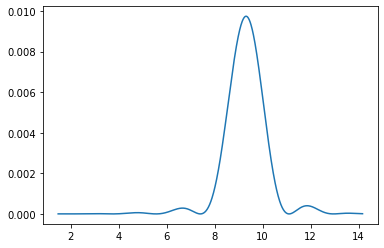

In [100]:
mags_LS = np.concatenate((mags.compressed(), mags.compressed(), mags.compressed(), mags.compressed(), mags.compressed()))
time_range = LC_time[-1] - LC_time[0]
time_LS = np.concatenate((LC_time, LC_time+time_range, LC_time+2*time_range, LC_time+3*time_range, LC_time+4*time_range))

freq1 = 1. / (LC_time[1] - LC_time[0])
freq2 = 1. / (LC_time[-1] - LC_time[0]) # difference b/w first and last time value

freqs = np.linspace(freq2, freq1, 1000)

lomb = lombscargle(time_LS, mags_LS, freqs, precenter=True)
plt.plot(freqs, lomb)



#### Finding coordinate bounds to use in catalogue searches:

In [90]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/PAL13/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/PAL13/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)

maxRA = max(max(huge_table_ch1['RA']), max(huge_table_ch2['RA']))
minRA = min(min(huge_table_ch1['RA']), min(huge_table_ch2['RA']))
maxdec = max(max(huge_table_ch1['dec']), max(huge_table_ch2['dec']))
mindec = min(min(huge_table_ch1['dec']), min(huge_table_ch2['dec']))

cmax = SkyCoord(maxRA, maxdec, frame='icrs', unit='deg')
cmin = SkyCoord(minRA, mindec, frame='icrs', unit='deg')

print(cmax.ra.hour)
print(cmin.ra.hour)
print(cmax.dec.deg)
print(cmin.dec.deg)
print('')
print(cmax.ra.hms)
print(cmin.ra.hms)
print(cmax.dec.dms)
print(cmin.dec.dms)
print('')
print(cmax.ra.deg)
print(cmin.ra.deg)
print(cmax.dec.deg)
print(cmin.dec.deg)

15.27274781593681
15.262954120891306
0.062338251056566346
-0.28863006858262924

hms_tuple(h=15.0, m=16.0, s=21.89213737251748)
hms_tuple(h=15.0, m=15.0, s=46.63483520870315)
dms_tuple(d=0.0, m=3.0, s=44.41770380363885)
dms_tuple(d=-0.0, m=-17.0, s=-19.068246897465357)

229.0912172390521
228.94431181336955
0.062338251056566346
-0.28863006858262924


In [93]:
df_viz = pd.read_csv('data/reference/vizier_rrl_data_01.txt', sep=',', header=0)
df_viz.rename(columns={'_RAJ2000': 'RA', '_DEJ2000': 'dec'}, inplace=True)
df_viz['ID'] = np.arange(len(df_viz))
c_viz = SkyCoord(df_viz['RA'], df_viz['dec'], frame='icrs', unit='deg')
print(c_viz)

df_CC = pd.read_csv('data/reference/CVSGC_PAL13_readable.txt', sep=',', header=0)
c_CC = SkyCoord(df_CC['RA'], df_CC['dec'])
print(c_CC)

file1 = base_dir+'PAL13/PAL13_3p6um.fits'
file2 = base_dir+'PAL13/PAL13_4p5um.fits'

with fits.open(file1) as hdu_list:
    data1 = hdu_list[0].data
    hdr1 = hdu_list[0].header
    data1 *= hdr1['EXPTIME'] / hdr1['FLUXCONV']
with fits.open(file2) as hdu_list:
    data2 = hdu_list[0].data
    hdr2 = hdu_list[0].header
    data2 *= hdr2['EXPTIME'] / hdr2['FLUXCONV']
    
w1 = wcs.WCS(hdr1)
w2 = wcs.WCS(hdr2)

pixcoords1 = w1.world_to_pixel(c_viz)
pixcoords2 = w2.world_to_pixel(c_viz)
pixcoords3 = w1.world_to_pixel(c_CC)
pixcoords4 = w2.world_to_pixel(c_CC)

pos1 = np.transpose((pixcoords1[0].tolist(), pixcoords1[1].tolist()))
pos2 = np.transpose((pixcoords2[0].tolist(), pixcoords2[1].tolist()))
pos3 = np.transpose((pixcoords3[0].tolist(), pixcoords3[1].tolist()))
pos4 = np.transpose((pixcoords4[0].tolist(), pixcoords4[1].tolist()))

ap1 = CircularAperture(pos1, r=20.)
ap2 = CircularAperture(pos2, r=20.)
ap3 = CircularAperture(pos3, r=20.)
ap4 = CircularAperture(pos4, r=20.)

'''print('Vizier 3p6um:')
plotting(data1, ap1, an=None, cmap='Greys', choice='ap_only', savename=None)
print('CC 3p6um:')
plotting(data1, ap3, an=None, cmap='Greys', choice='ap_only', savename=None)
print('Vizier 4p5um:')
plotting(data2, ap2, an=None, cmap='Greys', choice='ap_only', savename=None)
print('CC 4p5um:')
plotting(data2, ap4, an=None, cmap='Greys', choice='ap_only', savename=None)'''



idx, d2d, d3d = c_CC.match_to_catalog_sky(c_viz)

max_sep = 1. * u.arcsec
selection = (d2d > max_sep)
match_index = idx
match_index[selection] = -1
ind = ((match_index >= 0))

t_CC = Table.from_pandas(df_CC)
t_viz = Table.from_pandas(df_viz)

t_CC = t_CC[ind]
t_viz = t_viz[match_index][ind]


#df_viz = df_viz[ind]
#df_CC = df_CC[match_index][ind]

print(pos1)
print(pos2)

<SkyCoord (ICRS): (ra, dec) in deg
    [(229.09705423, -0.1419235 ), (229.14462534, -0.07361858),
     (228.99634825, -0.08977613), (228.98840114, -0.11479928),
     (228.99266626, -0.09659805), (228.99144962, -0.18985356),
     (229.05318547, -0.16753341)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(228.98825   , -0.11480556), (228.99145833, -0.18983333),
     (229.05316667, -0.16758333), (229.024125  , -0.18686111),
     (228.992625  , -0.0965    )]>
[[1150.60170978 -158.82720255]
 [ 700.10161856 -374.39386995]
 [ 939.30062615  487.95755074]
 [1095.16247159  510.79307935]
 [ 983.25919901  503.15629139]
 [1536.63079122  420.09211581]
 [1344.70841214   76.14263545]]
[[ 468.47152004 -138.0380139 ]
 [  17.4007439  -352.41083815]
 [ 258.88648642  509.3046005 ]
 [ 414.8084007   531.72655577]
 [ 302.88525631  524.3866757 ]
 [ 856.03326346  439.85493128]
 [ 663.20023803   96.41633692]]


In [88]:
t_viz

RA,dec,LC,Source,Pf,P1O,EpG,EpBP,EpRP,Gmag,BPmag,RPmag,[Fe/H],ID
float64,float64,str2,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
228.98840114087997,-0.11479928258,LC,4418914863842345856,--,0.29322862,1709.84967006,1709.86409316,1709.86769057,17.3769,17.5206,17.0727,--,3
228.99144962264,-0.18985356481,LC,4418913218870688768,0.45604927,0.33245990000000003,1709.60130575,1709.61128542,1709.59236243,17.3686,17.5148,17.0328,--,5
229.05318546816002,-0.16753341272,LC,4418726027016125056,--,0.32994609999999996,1709.75584394,1709.75584394,1709.75584394,17.3467,--,--,--,6
228.99266625762002,-0.09659804838,LC,4418920808077110784,--,0.33793290000000004,1709.66035563,1709.70228387,1709.61788942,17.3395,17.5235,17.0014,--,4


In [89]:
t_CC

ID,RA,dec,units,period,mean_magnitude,amplitude,colour,type
int64,str12,str12,str2,float64,float64,float64,str1,str3
1,15h15m57.18s,-00d06m53.3s,R0,0.2932,17.71,0.42,B,RR1
2,15h15m57.95s,-00d11m23.4s,R0,0.3325,17.81,0.4,B,RR1
3,15h16m12.76s,-00d10m03.3s,R0,0.33,17.7,0.5,B,RR1
5,15h15m58.23s,-00d05m47.4s,R0,0.2524,17.7,0.3,B,RR1


     obs_time             phot          flux  flux_error
        d                 mag          s**-1    s**-1   
------------------ ------------------ ------- ----------
2456907.9906678265  17.29687752761975 2273.05    7.23073
 2456908.064654538  17.57060974933377 1766.51    10.9456
 2457019.150542085  17.37835270727514 2108.72    5.01939
2457019.2245546123 17.589951069589517 1735.32    3.93261
 2457037.655496694  17.49678601592281  1890.8    6.24171
2457037.7294821367 17.574902139517533 1759.54    13.0526
2457068.8913133885 17.200324347711295 2484.45    10.8324
2457068.9653275763  17.26746891645328 2335.46    8.27176
 2457212.528650488 17.479615499969483 1920.94    9.19921
 2457235.275109625 17.437318925423398 1997.25    11.0776
 2457265.686008323 17.163799572535435 2569.45    6.31324
 2457265.760009001 17.394197322117833 2078.17    9.92288
 2457393.522512756 17.150716104469854  2600.6    6.97652
2457393.6986845187 17.585424417575428 1742.57    16.7855
2457444.1896921983 17.376290002

Text(0.5, 1.0, 'RRL1')

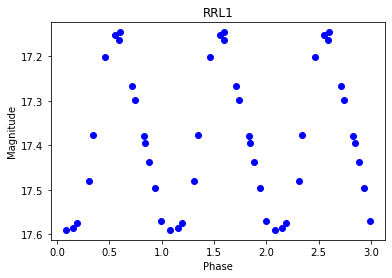

In [47]:
votable = parse('data/curves/proc_RRL1.vot')

table = votable.get_first_table()

print(table)

datavot = table.array
#print(datavot['obs_time'])

#Pvot_fund = 0.45604927
#Pvot_FO = 0.3324599
Pvot = 0.29322862

temp = [i / Pvot for i in datavot['obs_time']]
phasevot = temp - np.floor(temp)
print(phase)

magsvot = np.concatenate((datavot['phot'], datavot['phot'], datavot['phot']))
phasesvot = np.concatenate((phasevot, phasevot+1., phasevot+2.))

plt.plot(phasesvot, magsvot, 'bo')
#plt.plot(phasevot, datavot['obs_time'], 'bo')
plt.xlabel('Phase')
plt.ylabel('Magnitude')
plt.gca().invert_yaxis()
#plt.title('RRL2 using fundamental period')
#plt.title('RRL2 using first overtone period')
plt.title('RRL1')